In [18]:
from struct import pack, unpack
import pyaudio
import wave
import sys
import time
import numpy as np
from scipy.fftpack import dct, idct
import matplotlib.pyplot as plt

In [64]:
wf = wave.open('./sweep.wav', 'rb')
orig = []
recon = []
CHUNK = 16
data = wf.readframes(CHUNK)
tot_time = 0
num_chunks = 0

def unsigned_to_signed(x):
    return x if x < (1 << 16-1) else x - (1 << 16)

def signed_to_unsigned(x):
    return x & 0xffff

def convert(data, flip=True):
    global tot_time, num_chunks, orig, recon
    start = time.time()
    data = bytearray(data)
    
    
#     output = b''
#     for i in range(0, len(data), 2):
#         output += pack('H', data[i] + data[i+1] * 256)
#         if flip:
#             output += pack('H', invertbyte(data[i] + data[i+1] * 256))
#         else:
#              output += pack('H', data[i] + data[i+1] * 256)

    data_16 = [data[i] + data[i+1] * 256 for i in range (0,len(data), 2)]
    signed_data = np.clip([unsigned_to_signed(x) for x in data_16], -32765, 32765)

    freqs = np.fft.fft(signed_data)
    
    print(freqs)
    
    reconstruct = [int(x) for x in np.real(np.fft.ifft(freqs))]
    unsigned_reconstruct = [signed_to_unsigned(x) for x in reconstruct]
    
    orig += data_16
    recon += unsigned_reconstruct
#     np.replace(unsigned_reconstruct)

    output = b''
    for i in range(0, len(data_16)):
        output += pack('H', data_16[i])
        output += pack('H', unsigned_reconstruct[i])

                
    end = time.time()
    tot_time += end - start
    num_chunks += 1
    return output

wvData = b''
while data != b'':
    temp = convert(data, flip=True)
    wvData += temp
    data = wf.readframes(CHUNK)

print 1.*tot_time/num_chunks

wf_out = wave.open('sweep_trip2.wav', 'w')
wf_out.setparams((2, 2, 44100, 0, 'NONE', 'not compressed'))
wf_out.writeframes(wvData)
wf_out.close()

[ 0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j
  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j]
[ -1.00000000e+00+0.j          -7.07106781e-01-0.70710678j
  -8.26946080e-16-1.j           7.07106781e-01-0.70710678j
   1.00000000e+00+0.j           7.07106781e-01+0.70710678j
   8.26946080e-16+1.j          -7.07106781e-01+0.70710678j
  -1.00000000e+00+0.j          -7.07106781e-01-0.70710678j
  -8.26946080e-16-1.j           7.07106781e-01-0.70710678j
   1.00000000e+00+0.j           7.07106781e-01+0.70710678j
   8.26946080e-16+1.j          -7.07106781e-01+0.70710678j]
[ 0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j
  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j]
[ 0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j
  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j]
[ 0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j
  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j  0.+0.j]
[ 0

[ -7.51300000e+03 +0.j          -8.38268343e+00+41.14259547j
  -7.29289322e+00+20.02081528j  -7.07612047e+00+11.59016267j
  -8.00000000e+00 +7.j          -8.92387953e+00 +4.96274567j
  -8.70710678e+00 +4.02081528j  -7.61731657e+00 +2.51517847j
  -7.00000000e+00 +0.j          -7.61731657e+00 -2.51517847j
  -8.70710678e+00 -4.02081528j  -8.92387953e+00 -4.96274567j
  -8.00000000e+00 -7.j          -7.07612047e+00-11.59016267j
  -7.29289322e+00-20.02081528j  -8.38268343e+00-41.14259547j]
[ -7.25200000e+03 +0.j          -9.24830288e+00+45.84551161j
  -9.00000000e+00+18.3137085j   -8.59945618e+00+13.30354118j
  -8.00000000e+00+10.j          -5.98633025e+00 +7.26191062j
  -9.00000000e+00 +4.3137085j   -8.16591068e+00 +3.80388105j
  -8.00000000e+00 +0.j          -8.16591068e+00 -3.80388105j
  -9.00000000e+00 -4.3137085j   -5.98633025e+00 -7.26191062j
  -8.00000000e+00-10.j          -8.59945618e+00-13.30354118j
  -9.00000000e+00-18.3137085j   -9.24830288e+00-45.84551161j]
[-6959.00000000 +0.j  

  -3.00000000e+01 -76.84062043j  -1.94623850e+01-156.36458824j]
[ -5.21794000e+05  +0.j          -3.34623850e+01+220.03702697j
  -4.15857864e+01+108.63961031j  -4.45459963e+01 +64.83698381j
  -4.40000000e+01 +40.j          -4.65250715e+01 +27.80040388j
  -4.44142136e+01 +18.63961031j  -4.34665472e+01 +11.00044705j
  -4.20000000e+01  +0.j          -4.34665472e+01 -11.00044705j
  -4.44142136e+01 -18.63961031j  -4.65250715e+01 -27.80040388j
  -4.40000000e+01 -40.j          -4.45459963e+01 -64.83698381j
  -4.15857864e+01-108.63961031j  -3.34623850e+01-220.03702697j]
[ -5.20245000e+05  +0.j          -4.38765986e+01+271.84115562j
  -5.05857864e+01+127.95331881j  -5.21317827e+01 +83.49855957j
  -5.50000000e+01 +52.j          -5.41108580e+01 +38.17770839j
  -5.34142136e+01 +21.95331881j  -5.38807608e+01 +14.52030445j
  -5.30000000e+01  +0.j          -5.38807608e+01 -14.52030445j
  -5.34142136e+01 -21.95331881j  -5.41108580e+01 -38.17770839j
  -5.50000000e+01 -52.j          -5.21317827e+01 -83.

[ -5.17249000e+05  +0.j          -6.71516314e+01+392.43164534j
  -7.68786797e+01+189.42997821j  -7.50809206e+01+114.03233334j
  -7.60000000e+01 +77.j          -7.99901472e+01 +48.82923118j
  -8.11213203e+01 +35.42997821j  -7.37773008e+01 +19.22854317j
  -7.50000000e+01  +0.j          -7.37773008e+01 -19.22854317j
  -8.11213203e+01 -35.42997821j  -7.99901472e+01 -48.82923118j
  -7.60000000e+01 -77.j          -7.50809206e+01-114.03233334j
  -7.68786797e+01-189.42997821j  -6.71516314e+01-392.43164534j]
[ -5.14561000e+05  +0.j          -7.91379617e+01+461.05015764j
  -8.72928932e+01+221.40054096j  -9.03292235e+01+139.37697656j
  -9.00000000e+01 +95.j          -9.41560578e+01 +63.16168109j
  -8.87071068e+01 +37.40054096j  -8.83767570e+01 +16.83486217j
  -9.10000000e+01  +0.j          -8.83767570e+01 -16.83486217j
  -8.87071068e+01 -37.40054096j  -9.41560578e+01 -63.16168109j
  -9.00000000e+01 -95.j          -9.03292235e+01-139.37697656j
  -8.72928932e+01-221.40054096j  -7.91379617e+01-461.0

[ -3.99258000e+05   +0.j          -3.29245612e+02+1704.4266005j
  -3.36878680e+02 +821.53971799j  -3.39456206e+02 +505.11891105j
  -3.39000000e+02 +339.j          -3.42200648e+02 +224.28211576j
  -3.41121320e+02 +141.53971799j  -3.41097534e+02  +67.58980521j
  -3.40000000e+02   +0.j          -3.41097534e+02  -67.58980521j
  -3.41121320e+02 -141.53971799j  -3.42200648e+02 -224.28211576j
  -3.39000000e+02 -339.j          -3.39456206e+02 -505.11891105j
  -3.36878680e+02 -821.53971799j  -3.29245612e+02-1704.4266005j ]
[ -3.88239000e+05   +0.j          -3.40462385e+02+1763.34785885j
  -3.46000000e+02 +845.97474683j  -3.51545996e+02 +525.90807888j
  -3.47000000e+02 +350.j          -3.53525072e+02 +236.54437166j
  -3.46000000e+02 +143.97474683j  -3.50466547e+02  +69.98415163j
  -3.47000000e+02   +0.j          -3.50466547e+02  -69.98415163j
  -3.46000000e+02 -143.97474683j  -3.53525072e+02 -236.54437166j
  -3.47000000e+02 -350.j          -3.51545996e+02 -525.90807888j
  -3.46000000e+02 -845.97

[ 115525.00000000   +0.j            -552.46507563+2759.85086851j
    -550.70710678+1327.11035252j    -552.68924640 +823.8670062j
    -552.00000000 +549.j            -549.31075360 +369.06051472j
    -549.29289322 +227.11035252j    -549.53492437 +109.04437702j
    -549.00000000   +0.j            -549.53492437 -109.04437702j
    -549.29289322 -227.11035252j    -549.31075360 -369.06051472j
    -552.00000000 -549.j            -552.68924640 -823.8670062j
    -550.70710678-1327.11035252j    -552.46507563-2759.85086851j]
[ 133037.00000000   +0.j            -548.26197263+2739.81763101j
    -546.41421356+1313.33217793j    -544.35115330 +817.26326658j
    -545.00000000 +544.j            -542.82041957 +367.7704836j
    -543.58578644 +225.33217793j    -544.56645450 +106.32484802j
    -543.00000000   +0.j            -544.56645450 -106.32484802j
    -543.58578644 -225.33217793j    -542.82041957 -367.7704836j
    -545.00000000 -544.j            -544.35115330 -817.26326658j
    -546.41421356-1313.33217

[  5.09504000e+05  +0.j          -1.58615817e+02+710.0270508j
  -1.44707107e+02+343.9396462j   -1.44060858e+02+211.03927292j
  -1.45000000e+02+139.j          -1.40868074e+02 +90.81683477j
  -1.43292893e+02 +61.9396462j   -1.40455251e+02 +29.80461265j
  -1.42000000e+02  +0.j          -1.40455251e+02 -29.80461265j
  -1.43292893e+02 -61.9396462j   -1.40868074e+02 -90.81683477j
  -1.45000000e+02-139.j          -1.44060858e+02-211.03927292j
  -1.44707107e+02-343.9396462j   -1.58615817e+02-710.0270508j ]
[  5.13711000e+05  +0.j          -1.35615817e+02+603.72168257j
  -1.23707107e+02+289.41273427j  -1.21060858e+02+181.65722334j
  -1.22000000e+02+121.j          -1.17868074e+02 +83.66018193j
  -1.22292893e+02 +51.41273427j  -1.17455251e+02 +25.72464116j
  -1.19000000e+02  +0.j          -1.17455251e+02 -25.72464116j
  -1.22292893e+02 -51.41273427j  -1.17868074e+02 -83.66018193j
  -1.22000000e+02-121.j          -1.21060858e+02-181.65722334j
  -1.23707107e+02-289.41273427j  -1.35615817e+02-603.72

[-20400.00000000   +0.j            645.23044250-3225.21386085j
    641.70710678-1549.21800026j    642.84148733 -959.7893695j
    641.00000000 -641.j            643.15851267 -430.76758254j
    640.29289322 -265.21800026j    640.76955750 -128.19207389j
    642.00000000   +0.j            640.76955750 +128.19207389j
    640.29289322 +265.21800026j    643.15851267 +430.76758254j
    641.00000000 +641.j            642.84148733 +959.7893695j
    641.70710678+1549.21800026j    645.23044250+3225.21386085j]
[-40920.00000000   +0.j            642.93754928-3221.89362814j
    637.29289322-1546.8037867j     639.13438055 -957.99987052j
    641.00000000 -643.j            639.45140589 -430.39229712j
    638.70710678 -264.8037867j     638.47666428 -126.28605474j
    638.00000000   +0.j            638.47666428 +126.28605474j
    638.70710678 +264.8037867j     639.45140589 +430.39229712j
    641.00000000 +643.j            639.13438055 +957.99987052j
    637.29289322+1546.8037867j     642.93754928+3221.893

[-116404.00000000   +0.j            -661.72435763+3360.27645049j
    -668.41421356+1615.10887323j    -668.89714958+1000.98095234j
    -670.00000000 +668.j            -669.34549111 +446.17741945j
    -665.58578644 +277.10887323j    -668.03300169 +133.47291759j
    -668.00000000   +0.j            -668.03300169 -133.47291759j
    -665.58578644 -277.10887323j    -669.34549111 -446.17741945j
    -670.00000000 -668.j            -668.89714958-1000.98095234j
    -668.41421356-1615.10887323j    -661.72435763-3360.27645049j]
[-94919.00000000   +0.j           -668.27922347+3391.14759422j
   -671.58578644+1627.17994104j   -672.95540966+1010.6676937j
   -671.00000000 +674.j           -671.87301746 +449.4793845j
   -674.41421356 +279.17994104j   -670.89234940 +133.95928502j
   -671.00000000   +0.j           -670.89234940 -133.95928502j
   -674.41421356 -279.17994104j   -671.87301746 -449.4793845j
   -671.00000000 -674.j           -672.95540966-1010.6676937j
   -671.58578644-1627.17994104j   -668.279

[ 84462.00000000   +0.j            713.73802737-3604.60241585j
    718.00000000-1731.99112422j    717.64884670-1073.06633183j
    714.00000000 -718.j            719.17958043 -479.08408339j
    718.00000000 -295.99112422j    717.43354550 -142.62016741j
    718.00000000   +0.j            717.43354550 +142.62016741j
    718.00000000 +295.99112422j    719.17958043 +479.08408339j
    714.00000000 +718.j            717.64884670+1073.06633183j
    718.00000000+1731.99112422j    713.73802737+3604.60241585j]
[ 61429.00000000   +0.j            719.60364682-3631.67666259j
    721.70710678-1743.35508525j    724.17218241-1082.41498009j
    722.00000000 -723.j            721.24203115 -480.87638246j
    720.29289322 -297.35508525j    722.98213962 -146.13806496j
    723.00000000   +0.j            722.98213962 +146.13806496j
    720.29289322 +297.35508525j    721.24203115 +480.87638246j
    722.00000000 +723.j            724.17218241+1082.41498009j
    721.70710678+1743.35508525j    719.60364682+3631.6

[  4.34740000e+05   +0.j          -4.55750807e+02+2162.53920886j
  -4.36121320e+02+1038.40472504j  -4.33691235e+02 +643.63026816j
  -4.33000000e+02 +433.j          -4.31580843e+02 +287.99239096j
  -4.31878680e+02 +176.40472504j  -4.34977115e+02  +82.90133166j
  -4.34000000e+02   +0.j          -4.34977115e+02  -82.90133166j
  -4.31878680e+02 -176.40472504j  -4.31580843e+02 -287.99239096j
  -4.33000000e+02 -433.j          -4.33691235e+02 -643.63026816j
  -4.36121320e+02-1038.40472504j  -4.55750807e+02-2162.53920886j]
[  4.48048000e+05   +0.j          -4.25598566e+02+2010.8014163j
  -4.06121320e+02 +967.39253173j  -4.02456602e+02 +598.11896935j
  -4.05000000e+02 +399.j          -3.98815476e+02 +263.33390589j
  -4.01878680e+02 +165.39253173j  -4.01129356e+02  +80.01635284j
  -3.98000000e+02   +0.j          -4.01129356e+02  -80.01635284j
  -4.01878680e+02 -165.39253173j  -3.98815476e+02 -263.33390589j
  -4.05000000e+02 -399.j          -4.02456602e+02 -598.11896935j
  -4.06121320e+02 -967.39

[ -4.78772000e+05   +0.j          -3.05184662e+02+1672.87988011j
  -3.22343146e+02 +804.34732983j  -3.27453608e+02 +496.21539694j
  -3.30000000e+02 +330.j          -3.31860100e+02 +218.3491644j
  -3.33656854e+02 +140.34732983j  -3.31501630e+02  +67.01364757j
  -3.28000000e+02   +0.j          -3.31501630e+02  -67.01364757j
  -3.33656854e+02 -140.34732983j  -3.31860100e+02 -218.3491644j
  -3.30000000e+02 -330.j          -3.27453608e+02 -496.21539694j
  -3.22343146e+02 -804.34732983j  -3.05184662e+02-1672.87988011j]
[ -4.67600000e+05   +0.j          -3.38215582e+02+1850.99221065j
  -3.61585786e+02 +889.43059095j  -3.65809562e+02 +554.61234947j
  -3.66000000e+02 +370.j          -3.71746787e+02 +248.336954j
  -3.64414214e+02 +151.43059095j  -3.68228069e+02  +72.71681518j
  -3.68000000e+02   +0.j          -3.68228069e+02  -72.71681518j
  -3.64414214e+02 -151.43059095j  -3.71746787e+02 -248.336954j
  -3.66000000e+02 -370.j          -3.65809562e+02 -554.61234947j
  -3.61585786e+02 -889.4305909

[-204829.00000000   +0.j             799.38537407-3946.627412j
     784.00000000-1895.15764646j     787.21937059-1176.84919344j
     787.00000000 -784.j             783.70956160 -525.11968695j
     784.00000000 -325.15764646j     785.68569375 -154.89790551j
     783.00000000   +0.j             785.68569375 +154.89790551j
     784.00000000 +325.15764646j     783.70956160 +525.11968695j
     787.00000000 +784.j             787.21937059+1176.84919344j
     784.00000000+1895.15764646j     799.38537407+3946.627412j  ]
[-229665.00000000   +0.j             780.93396818-3853.28014406j
     771.53553391-1850.580482j       765.28182131-1147.43154433j
     768.00000000 -765.j             766.23289732 -510.02793965j
     764.46446609 -314.580482j       767.55131319 -151.87653938j
     769.00000000   +0.j             767.55131319 +151.87653938j
     764.46446609 +314.580482j       766.23289732 +510.02793965j
     768.00000000 +765.j             765.28182131+1147.43154433j
     771.53553391+1850.580

[ 24158.00000000   +0.j            894.59945618-4499.30293477j
    889.58578644-2160.72113832j    894.16591068-1337.44848784j
    892.00000000 -896.j            895.24830288 -597.42042475j
    892.41421356 -370.72113832j    891.98633025 -179.27487169j
    894.00000000   +0.j            891.98633025 +179.27487169j
    892.41421356 +370.72113832j    895.24830288 +597.42042475j
    892.00000000 +896.j            894.16591068+1337.44848784j
    889.58578644+2160.72113832j    894.59945618+4499.30293477j]
[-4504.00000000   +0.j           900.47874538-4508.43373422j
   896.70710678-2164.84245867j   897.44094352-1340.8243828j
   897.00000000 -897.j           895.14484292 -599.13946546j
   895.29289322 -370.84245867j   894.93546818 -178.74881689j
   894.00000000   +0.j           894.93546818 +178.74881689j
   895.29289322 +370.84245867j   895.14484292 +599.13946546j
   897.00000000 +897.j           897.44094352+1340.8243828j
   896.70710678+2164.84245867j   900.47874538+4508.43373422j]
[-33158.

[-83665.00000000   +0.j            931.80316873-4659.8025131j
    930.41421356-2238.97597232j    928.65771627-1388.66010496j
    927.00000000 -924.j            924.51385661 -620.70816032j
    927.58578644 -382.97597232j    927.02525840 -183.85056846j
    927.00000000   +0.j            927.02525840 +183.85056846j
    927.58578644 +382.97597232j    924.51385661 +620.70816032j
    927.00000000 +924.j            928.65771627+1388.66010496j
    930.41421356+2238.97597232j    931.80316873+4659.8025131j ]
[-113174.00000000   +0.j             925.58220534-4605.75008157j
     920.41421356-2210.41962313j     916.56165432-1371.59798538j
     918.00000000 -916.j             917.19570499 -611.34452555j
     917.58578644 -380.41962313j     916.66043535 -181.49662174j
     918.00000000   +0.j             916.66043535 +181.49662174j
     917.58578644 +380.41962313j     917.19570499 +611.34452555j
     918.00000000 +916.j             916.56165432+1371.59798538j
     920.41421356+2210.41962313j     925.

[-273597.00000000   +0.j             861.43265504-4208.26583834j
     842.12132034-2018.98964493j     840.47027131-1253.58290288j
     840.00000000 -837.j             834.21602019 -560.18939947j
     837.87867966 -346.98964493j     835.88105346 -166.87233493j
     837.00000000   +0.j             835.88105346 +166.87233493j
     837.87867966 +346.98964493j     834.21602019 +560.18939947j
     840.00000000 +837.j             840.47027131+1253.58290288j
     842.12132034+2018.98964493j     861.43265504+4208.26583834j]
[-299884.00000000   +0.j             830.49091512-4042.30537502j
     811.53553391-1941.32059737j     808.32961902-1203.05426043j
     805.00000000 -803.j             805.77088604 -535.58463857j
     804.46446609 -331.32059737j     803.40857982 -158.83575316j
     802.00000000   +0.j             803.40857982 +158.83575316j
     804.46446609 +331.32059737j     805.77088604 +535.58463857j
     805.00000000 +803.j             808.32961902+1203.05426043j
     811.53553391+1941.3

[ -5.23043000e+05  +0.j           1.20197131e+02-339.24595953j
   7.86568542e+01-163.5807358j    7.39132031e+01-100.68679966j
   7.30000000e+01 -62.j           6.66309528e+01 -44.35375518j
   6.73431458e+01 -31.5807358j    7.12587127e+01 -10.91291505j
   6.90000000e+01  +0.j           7.12587127e+01 +10.91291505j
   6.73431458e+01 +31.5807358j    6.66309528e+01 +44.35375518j
   7.30000000e+01 +62.j           7.39132031e+01+100.68679966j
   7.86568542e+01+163.5807358j    1.20197131e+02+339.24595953j]
[ -5.24201000e+05+0.j           3.32804141e+01-7.58960335j
   2.11923882e+01-8.94974747j   1.12356382e+01-5.68245792j
   6.00000000e+00-3.j           3.45065333e+00-2.02560367j
   2.80761184e+00-0.94974747j   4.03329440e+00+0.0672509j
   5.00000000e+00+0.j           4.03329440e+00-0.0672509j
   2.80761184e+00+0.94974747j   3.45065333e+00+2.02560367j
   6.00000000e+00+3.j           1.12356382e+01+5.68245792j
   2.11923882e+01+8.94974747j   3.32804141e+01+7.58960335j]
[ -5.23362000e+05  +0.j 

    -756.46446609-1852.40890912j    -727.67857666-3850.39345685j]
[-338975.00000000   +0.j            -777.05386208+4084.888914j
    -803.87867966+1961.04851943j    -811.82950318+1215.70895492j
    -812.00000000 +811.j            -811.14105956 +545.02612962j
    -808.12132034 +337.04851943j    -811.97557517 +162.20608871j
    -809.00000000   +0.j            -811.97557517 -162.20608871j
    -808.12132034 -337.04851943j    -811.14105956 -545.02612962j
    -812.00000000 -811.j            -811.82950318-1215.70895492j
    -803.87867966-1961.04851943j    -777.05386208-4084.888914j  ]
[-312305.00000000   +0.j            -823.04967144+4306.25036432j
    -846.17157288+2068.56680939j    -852.82323145+1279.32916598j
    -853.00000000 +856.j            -856.14733130 +572.19554719j
    -851.82842712 +352.56680939j    -851.97976581 +171.11674554j
    -849.00000000   +0.j            -851.97976581 -171.11674554j
    -851.82842712 -352.56680939j    -856.14733130 -572.19554719j
    -853.00000000 -856.j 

[  5.18719000e+05  +0.j          -2.15734137e+02+792.17158946j
  -1.70949747e+02+377.32442251j  -1.65213494e+02+234.6920719j
  -1.62000000e+02+157.j          -1.59330662e+02+101.80058619j
  -1.61050253e+02 +65.32442251j  -1.59721707e+02 +31.28010375j
  -1.55000000e+02  +0.j          -1.59721707e+02 -31.28010375j
  -1.61050253e+02 -65.32442251j  -1.59330662e+02-101.80058619j
  -1.62000000e+02-157.j          -1.65213494e+02-234.6920719j
  -1.70949747e+02-377.32442251j  -2.15734137e+02-792.17158946j]
[  5.22626000e+05  +0.j          -1.44365123e+02+415.47967886j
  -9.66568542e+01+196.13708499j  -9.18890710e+01+126.12429745j
  -8.80000000e+01 +84.j          -8.52408713e+01 +58.77905966j
  -8.53431458e+01 +30.13708499j  -8.65049345e+01 +16.13444107j
  -8.60000000e+01  +0.j          -8.65049345e+01 -16.13444107j
  -8.53431458e+01 -30.13708499j  -8.52408713e+01 -58.77905966j
  -8.80000000e+01 -84.j          -9.18890710e+01-126.12429745j
  -9.66568542e+01-196.13708499j  -1.44365123e+02-415.479

[ 210559.00000000   +0.j            1021.10854106-5274.60300677j
    1043.29289322-2532.80292015j    1042.83629166-1569.5567616j
    1046.00000000-1051.j            1046.47741684 -700.53670774j
    1044.70710678 -432.80292015j    1045.57775044 -209.58295291j
    1053.00000000   +0.j            1045.57775044 +209.58295291j
    1044.70710678 +432.80292015j    1046.47741684 +700.53670774j
    1046.00000000+1051.j            1042.83629166+1569.5567616j
    1043.29289322+2532.80292015j    1021.10854106+5274.60300677j]
[ 176536.00000000   +0.j            1057.83558932-5423.08509844j
    1071.17157288-2602.52222024j    1075.87669136-1613.42340435j
    1076.00000000-1080.j            1074.60859002 -722.37896388j
    1076.82842712 -446.52222024j    1075.67912930 -216.04065797j
    1072.00000000   +0.j            1075.67912930 +216.04065797j
    1076.82842712 +446.52222024j    1074.60859002 +722.37896388j
    1076.00000000+1080.j            1075.87669136+1613.42340435j
    1071.17157288+2602.522

[-437180.00000000   +0.j            -597.83858933+3295.34091285j
    -640.92893219+1583.72409692j    -647.60273458 +976.09719412j
    -650.00000000 +656.j            -649.02468242 +440.30585453j
    -655.07106781 +271.72409692j    -653.53399367 +131.54957326j
    -648.00000000   +0.j            -653.53399367 -131.54957326j
    -655.07106781 -271.72409692j    -649.02468242 -440.30585453j
    -650.00000000 -656.j            -647.60273458 -976.09719412j
    -640.92893219-1583.72409692j    -597.83858933-3295.34091285j]
[-415144.00000000   +0.j            -668.17607289+3645.42058797j
    -711.34314575+1750.89061916j    -721.41749196+1084.87326725j
    -720.00000000 +726.j            -725.45256572 +485.67781537j
    -722.65685425 +296.89061916j    -724.95386943 +146.2251361j
    -724.00000000   +0.j            -724.95386943 -146.2251361j
    -722.65685425 -296.89061916j    -725.45256572 -485.67781537j
    -720.00000000 -726.j            -721.41749196-1084.87326725j
    -711.34314575-1750.890

[ 147782.00000000   +0.j            1153.26705373-5921.89935876j
    1174.00000000-2843.11514935j    1177.06673416-1761.46039232j
    1176.00000000-1178.j            1176.24697434 -787.57323937j
    1174.00000000 -483.11514935j    1177.41923777 -232.01220581j
    1178.00000000   +0.j            1177.41923777 +232.01220581j
    1174.00000000 +483.11514935j    1176.24697434 +787.57323937j
    1176.00000000+1178.j            1177.06673416+1761.46039232j
    1174.00000000+2843.11514935j    1153.26705373+5921.89935876j]
[ 109741.00000000   +0.j            1183.83139869-6035.57902915j
    1195.87867966-2899.76338163j    1196.87041963-1794.7788649j
    1198.00000000-1199.j            1199.61486175 -800.66631521j
    1200.12132034 -495.76338163j    1195.68331994 -241.46647945j
    1199.00000000   +0.j            1195.68331994 +241.46647945j
    1200.12132034 +495.76338163j    1199.61486175 +800.66631521j
    1198.00000000+1199.j            1196.87041963+1794.7788649j
    1195.87867966+2899.763

[-48508.00000000   +0.j          -1254.48972449+6340.30918889j
  -1259.00000000+3047.73751571j  -1259.04939051+1884.20619698j
  -1260.00000000+1262.j          -1263.19325017 +842.97380623j
  -1259.00000000 +521.73751571j  -1259.26763482 +251.07679815j
  -1256.00000000   +0.j          -1259.26763482 -251.07679815j
  -1259.00000000 -521.73751571j  -1263.19325017 -842.97380623j
  -1260.00000000-1262.j          -1259.04939051-1884.20619698j
  -1259.00000000-3047.73751571j  -1254.48972449-6340.30918889j]
[-8063.00000000   +0.j         -1263.98633025+6364.44588635j
 -1266.00000000+3057.39436996j -1267.24830288+1892.68922579j
 -1267.00000000+1266.j         -1266.16591068 +845.31469942j
 -1266.00000000 +523.39436996j -1266.59945618 +253.07135998j
 -1267.00000000   +0.j         -1266.59945618 -253.07135998j
 -1266.00000000 -523.39436996j -1266.16591068 -845.31469942j
 -1267.00000000-1266.j         -1267.24830288-1892.68922579j
 -1266.00000000-3057.39436996j -1263.98633025-6364.44588635j]
[ 3242

[-481444.00000000   +0.j             590.59825634-2581.66354379j
     531.07106781-1240.07734394j     524.87380846 -771.32729184j
     520.00000000 -518.j             513.18506605 -345.51574972j
     516.92893219 -208.07734394j     515.34286915  -99.85200167j
     516.00000000   +0.j             515.34286915  +99.85200167j
     516.92893219 +208.07734394j     513.18506605 +345.51574972j
     520.00000000 +518.j             524.87380846 +771.32729184j
     531.07106781+1240.07734394j     590.59825634+2581.66354379j]
[ -4.96445000e+05   +0.j           4.97453413e+02-2097.72499157j
   4.36778175e+02-1006.01994873j   4.26395063e+02 -622.86783028j
   4.22000000e+02 -417.j           4.20249598e+02 -277.9995057j
   4.21221825e+02 -172.01994873j   4.19901926e+02  -80.85666698j
   4.21000000e+02   +0.j           4.19901926e+02  +80.85666698j
   4.21221825e+02 +172.01994873j   4.20249598e+02 +277.9995057j
   4.22000000e+02 +417.j           4.26395063e+02 +622.86783028j
   4.36778175e+02+1006.019

[-78051.00000000   +0.j           1345.06095072-6701.06085957j
   1336.70710678-3217.85378542j   1333.00259784-1994.0516021j
   1332.00000000-1335.j           1331.34054791 -889.75824481j
   1335.29289322 -553.85378542j   1330.59590353 -264.76750228j
   1331.00000000   +0.j           1330.59590353 +264.76750228j
   1335.29289322 +553.85378542j   1331.34054791 +889.75824481j
   1332.00000000+1335.j           1333.00259784+1994.0516021j
   1336.70710678+3217.85378542j   1345.06095072+6701.06085957j]
[-120406.00000000   +0.j            1332.95390966-6595.39694002j
    1314.41421356-3168.44819383j    1315.02932779-1959.99189477j
    1314.00000000-1312.j            1311.07117727 -876.50972067j
    1311.58578644 -542.44819383j    1312.94558528 -259.91476592j
    1310.00000000   +0.j            1312.94558528 +259.91476592j
    1311.58578644 +542.44819383j    1311.07117727 +876.50972067j
    1314.00000000+1312.j            1315.02932779+1959.99189477j
    1314.41421356+3168.44819383j    1332.9

[ 239601.00000000   +0.j            1192.23702361-6224.47727757j
    1226.05025253-2987.08928344j    1233.42008980-1854.12235753j
    1232.00000000-1237.j            1235.79311364 -825.11536353j
    1235.94974747 -513.08928344j    1234.54977296 -247.47028357j
    1235.00000000   +0.j            1234.54977296 +247.47028357j
    1235.94974747 +513.08928344j    1235.79311364 +825.11536353j
    1232.00000000+1237.j            1233.42008980+1854.12235753j
    1226.05025253+2987.08928344j    1192.23702361+6224.47727757j]
[ 199236.00000000   +0.j            1250.92687954-6470.5686098j
    1279.46446609-3105.97153443j    1282.10872666-1927.05549608j
    1285.00000000-1287.j            1284.03340897 -860.86978653j
    1286.53553391 -529.97153443j    1286.93098484 -256.38290025j
    1286.00000000   +0.j            1286.93098484 +256.38290025j
    1286.53553391 +529.97153443j    1284.03340897 +860.86978653j
    1285.00000000+1287.j            1282.10872666+1927.05549608j
    1279.46446609+3105.97

    1370.41421356+3318.1294347j     1343.86442882+6910.14458642j]
[ 103743.00000000   +0.j            1386.21827276-7060.30852648j
    1402.70710678-3390.84873479j    1402.95281183-2099.85180735j
    1404.00000000-1405.j            1403.53246955 -938.74012421j
    1401.29289322 -578.84873479j    1403.29644587 -279.19684333j
    1401.00000000   +0.j            1403.29644587 +279.19684333j
    1401.29289322 +578.84873479j    1403.53246955 +938.74012421j
    1404.00000000+1405.j            1402.95281183+2099.85180735j
    1402.70710678+3390.84873479j    1386.21827276+7060.30852648j]
[ 58476.00000000   +0.j           1414.57003560-7158.22433001j
   1421.00000000-3436.01168569j   1424.67297881-2130.45949925j
   1422.00000000-1424.j           1425.56966187 -952.19348718j
   1421.00000000 -586.01168569j   1427.18732372 -283.95831793j
   1420.00000000   +0.j           1427.18732372 +283.95831793j
   1421.00000000 +586.01168569j   1425.56966187 +952.19348718j
   1422.00000000+1424.j           1

[-148434.00000000   +0.j            1443.35974194-7100.07583653j
    1419.24264069-3408.45533651j    1412.60257076-2115.76220273j
    1414.00000000-1414.j            1416.66950718 -944.60888903j
    1410.75735931 -582.45533651j    1411.36818012 -280.92252282j
    1410.00000000   +0.j            1411.36818012 +280.92252282j
    1410.75735931 +582.45533651j    1416.66950718 +944.60888903j
    1414.00000000+1414.j            1412.60257076+2115.76220273j
    1419.24264069+3408.45533651j    1443.35974194+7100.07583653j]
[-192990.00000000   +0.j            1407.81175737-6880.06294167j
    1377.24264069-3304.22993976j    1373.69383253-2048.17144071j
    1372.00000000-1368.j            1369.92139116 -910.64049337j
    1368.75735931 -562.22993976j    1372.57301894 -270.53199433j
    1370.00000000   +0.j            1372.57301894 +270.53199433j
    1368.75735931 +562.22993976j    1369.92139116 +910.64049337j
    1372.00000000+1368.j            1373.69383253+2048.17144071j
    1377.24264069+3304.2

[-461667.00000000   +0.j            -622.16121251+3628.89762598j
    -696.80761184+1745.76929881j    -705.38556633+1079.31891815j
    -714.00000000 +719.j            -715.04084054 +479.19453408j
    -715.19238816 +297.76929881j    -713.41238062 +144.77324192j
    -713.00000000   +0.j            -713.41238062 -144.77324192j
    -715.19238816 -297.76929881j    -715.04084054 -479.19453408j
    -714.00000000 -719.j            -705.38556633-1079.31891815j
    -696.80761184-1745.76929881j    -622.16121251-3628.89762598j]
[-436754.00000000   +0.j            -745.45410573+4234.41620555j
    -816.22182541+2035.06071274j    -830.09267312+1263.31423458j
    -833.00000000 +845.j            -839.74794732 +562.36438198j
    -831.77817459 +345.06071274j    -836.70527383 +169.46635295j
    -836.00000000   +0.j            -836.70527383 -169.46635295j
    -831.77817459 -345.06071274j    -839.74794732 -562.36438198j
    -833.00000000 -845.j            -830.09267312-1263.31423458j
    -816.22182541-2035.0

[ 345398.00000000   +0.j           -1245.19144079+5869.76034439j
   -1187.19238816+2816.68012051j   -1178.04390978+1749.01767041j
   -1175.00000000+1169.j           -1173.42917829 +782.82900227j
   -1168.80761184 +482.68012051j   -1171.33547114 +231.57167625j
   -1168.00000000   +0.j           -1171.33547114 -231.57167625j
   -1168.80761184 -482.68012051j   -1173.42917829 -782.82900227j
   -1175.00000000-1169.j           -1178.04390978-1749.01767041j
   -1187.19238816-2816.68012051j   -1245.19144079-5869.76034439j]
[ 381242.00000000   +0.j           -1153.56314511+5353.44098246j
   -1088.60660172+2570.43033715j   -1077.51158324+1594.66836449j
   -1073.00000000+1065.j           -1068.30465057 +708.97926307j
   -1067.39339828 +440.43033715j   -1068.62062107 +211.75188105j
   -1072.00000000   +0.j           -1068.62062107 -211.75188105j
   -1067.39339828 -440.43033715j   -1068.30465057 -708.97926307j
   -1073.00000000-1065.j           -1077.51158324-1594.66836449j
   -1088.60660172-2570.4

[ 183174.00000000   +0.j            1454.02025085-7541.88225565j
    1487.75735931-3623.32034356j    1494.33029958-2247.62942053j
    1498.00000000-1502.j            1497.46869029-1002.16030628j
    1496.24264069 -619.32034356j    1498.18075927 -296.41314141j
    1494.00000000   +0.j            1498.18075927 +296.41314141j
    1496.24264069 +619.32034356j    1497.46869029+1002.16030628j
    1498.00000000+1502.j            1494.33029958+2247.62942053j
    1487.75735931+3623.32034356j    1454.02025085+7541.88225565j]
[ 134430.00000000   +0.j            1515.13946165-7781.10476106j
    1537.87867966-3737.49548777j    1542.19224514-2318.83551082j
    1545.00000000-1549.j            1547.36410405-1033.01610815j
    1542.12132034 -639.49548777j    1543.30418916 -307.28535839j
    1544.00000000   +0.j            1543.30418916 +307.28535839j
    1542.12132034 +639.49548777j    1547.36410405+1033.01610815j
    1545.00000000+1549.j            1542.19224514+2318.83551082j
    1537.87867966+3737.4

    -731.56497116-1843.75205487j    -644.38367591-3839.04588465j]
[-437781.00000000   +0.j            -790.94593977+4554.76957987j
    -875.68629150+2187.86327395j    -889.15879773+1355.92482097j
    -897.00000000 +906.j            -900.92446339 +605.36984595j
    -898.31370850 +371.86327395j    -902.97079911 +180.21460485j
    -901.00000000   +0.j            -902.97079911 -180.21460485j
    -898.31370850 -371.86327395j    -900.92446339 -605.36984595j
    -897.00000000 -906.j            -889.15879773-1355.92482097j
    -875.68629150-2187.86327395j    -790.94593977-4554.76957987j]
[-406774.00000000   +0.j            -935.59267692+5224.45659439j
   -1010.97918472+2505.8323574j    -1024.57560913+1550.86992745j
   -1031.00000000+1037.j           -1034.67922486 +694.96257196j
   -1035.02081528 +425.8323574j    -1033.15248908 +208.5492389j
   -1032.00000000   +0.j           -1033.15248908 -208.5492389j
   -1035.02081528 -425.8323574j    -1034.67922486 -694.96257196j
   -1031.00000000-1037.j 

  -6.43137085e+01 -80.66904756j  -1.70939247e+02-159.25127545j]
[  5.22369000e+05  +0.j          -2.74241617e+00-700.56555627j
   1.01443651e+02-336.57568517j   1.21333182e+02-208.87596008j
   1.27000000e+02-142.j           1.34892214e+02 -95.72458974j
   1.32556349e+02 -56.57568517j   1.34517019e+02 -27.41418593j
   1.33000000e+02  +0.j           1.34517019e+02 +27.41418593j
   1.32556349e+02 +56.57568517j   1.34892214e+02 +95.72458974j
   1.27000000e+02+142.j           1.21333182e+02+208.87596008j
   1.01443651e+02+336.57568517j  -2.74241617e+00+700.56555627j]
[  5.15318000e+05   +0.j           1.71754190e+02-1567.84694688j
   2.75857864e+02 -753.23463146j   2.94532095e+02 -463.48011296j
   3.02000000e+02 -312.j           3.02864875e+02 -203.01085004j
   3.04142136e+02 -129.23463146j   3.06848841e+02  -63.37768396j
   3.02000000e+02   +0.j           3.06848841e+02  +63.37768396j
   3.04142136e+02 +129.23463146j   3.02864875e+02 +203.01085004j
   3.02000000e+02 +312.j           2.9453

[-309380.00000000   +0.j           -1305.68515777+7002.92539986j
   -1371.22182541+3362.46395848j   -1381.08787294+2087.00226989j
   -1385.00000000+1395.j           -1387.68167968 +933.00328512j
   -1386.77817459 +570.46395848j   -1389.54528961 +276.92641509j
   -1390.00000000   +0.j           -1389.54528961 -276.92641509j
   -1386.77817459 -570.46395848j   -1387.68167968 -933.00328512j
   -1385.00000000-1395.j           -1381.08787294-2087.00226989j
   -1371.22182541-3362.46395848j   -1305.68515777-7002.92539986j]
[-263278.00000000   +0.j           -1415.02533196+7504.05249488j
   -1473.51471863+3604.00663506j   -1483.04588044+2233.58464459j
   -1486.00000000+1488.j           -1486.89524506 +994.74294735j
   -1490.48528137 +616.00663506j   -1487.03354255 +297.21079763j
   -1486.00000000   +0.j           -1487.03354255 -297.21079763j
   -1490.48528137 -616.00663506j   -1486.89524506 -994.74294735j
   -1486.00000000-1488.j           -1483.04588044-2233.58464459j
   -1473.51471863-3604.0

   8.52634560e+01+105.93250353j   1.99121518e+02+222.83392397j]
[ -5.22341000e+05  +0.j           1.01723806e+01+731.4367j
  -1.07857864e+02+352.64675298j  -1.24006161e+02+218.56270143j
  -1.31000000e+02+144.j          -1.38461876e+02 +99.02655478j
  -1.36142136e+02 +54.64675298j  -1.39704343e+02 +27.90055335j
  -1.41000000e+02  +0.j          -1.39704343e+02 -27.90055335j
  -1.36142136e+02 -54.64675298j  -1.38461876e+02 -99.02655478j
  -1.31000000e+02-144.j          -1.24006161e+02-218.56270143j
  -1.07857864e+02-352.64675298j   1.01723806e+01-731.4367j    ]
[ -5.14860000e+05   +0.j          -1.79617118e+02+1676.95180994j
  -2.94443651e+02 +806.93311627j  -3.13912180e+02 +496.6043521j
  -3.22000000e+02 +330.j          -3.23141643e+02 +222.73811956j
  -3.25556349e+02 +134.93311627j  -3.27329058e+02  +67.0855774j
  -3.28000000e+02   +0.j          -3.27329058e+02  -67.0855774j
  -3.25556349e+02 -134.93311627j  -3.23141643e+02 -222.73811956j
  -3.22000000e+02 -330.j          -3.13912180e+0

[-304189.00000000   +0.j            1561.80725736-7381.89974131j
    1492.31370850-3541.23708244j    1480.10476770-2197.86501866j
    1479.00000000-1468.j            1472.29725256 -983.73399953j
    1469.68629150 -605.23708244j    1469.79072239 -291.76872218j
    1467.00000000   +0.j            1469.79072239 +291.76872218j
    1469.68629150 +605.23708244j    1472.29725256 +983.73399953j
    1479.00000000+1468.j            1480.10476770+2197.86501866j
    1492.31370850+3541.23708244j    1561.80725736+7381.89974131j]
[-349337.00000000   +0.j            1451.26875189-6753.50016517j
    1372.43502884-3240.16749392j    1357.94145485-2009.03132947j
    1352.00000000-1341.j            1347.38949759 -899.03948738j
    1345.56497116 -554.16749392j    1347.40029567 -263.50832308j
    1341.00000000   +0.j            1347.40029567 +263.50832308j
    1345.56497116 +554.16749392j    1347.38949759 +899.03948738j
    1352.00000000+1341.j            1357.94145485+2009.03132947j
    1372.43502884+3240.1

[-21553.00000000   +0.j           1854.74071801-9282.55849268j
   1849.70710678-4457.5169158j    1847.79209682-2763.36522419j
   1844.00000000-1845.j           1843.96526249-1234.67453835j
   1848.29289322 -759.5169158j    1845.50192268 -365.86780683j
   1845.00000000   +0.j           1845.50192268 +365.86780683j
   1848.29289322 +759.5169158j    1843.96526249+1234.67453835j
   1844.00000000+1845.j           1847.79209682+2763.36522419j
   1849.70710678+4457.5169158j    1854.74071801+9282.55849268j]
[-80383.00000000   +0.j           1850.87778919-9178.83212241j
   1833.12132034-4407.23264455j   1832.41201122-2731.17113631j
   1828.00000000-1825.j           1827.68849384-1219.87742009j
   1828.87867966 -753.23264455j   1829.02170575 -363.53840618j
   1827.00000000   +0.j           1829.02170575 +363.53840618j
   1828.87867966 +753.23264455j   1827.68849384+1219.87742009j
   1828.00000000+1825.j           1832.41201122+2731.17113631j
   1833.12132034+4407.23264455j   1850.87778919+9178.8

[-343957.00000000   +0.j            1538.98533778-7152.89042755j
    1449.89949494-3430.59747213j    1435.97977346-2127.42169739j
    1433.00000000-1424.j            1430.52275186 -951.98411244j
    1430.10050506 -588.59747213j    1426.51213690 -281.4528426j
    1427.00000000   +0.j            1426.51213690 +281.4528426j
    1430.10050506 +588.59747213j    1430.52275186 +951.98411244j
    1433.00000000+1424.j            1435.97977346+2127.42169739j
    1449.89949494+3430.59747213j    1538.98533778+7152.89042755j]
[-387221.00000000   +0.j            1400.66360506-6381.24868135j
    1304.14213562-3060.80858353j    1286.90625083-1900.13445274j
    1281.00000000-1266.j            1277.93942024 -845.44621787j
    1275.85786438 -522.80858353j    1274.49072387 -254.56044649j
    1275.00000000   +0.j            1274.49072387 +254.56044649j
    1275.85786438 +522.80858353j    1277.93942024 +845.44621787j
    1281.00000000+1266.j            1286.90625083+1900.13445274j
    1304.14213562+3060.808

[-451344.00000000   +0.j            1135.81703663-4907.052358j
    1016.26345597-2356.56533009j     996.42111247-1458.36280101j
     989.00000000 -977.j             982.28242297 -655.23214082j
     983.73654403 -402.56533009j     981.47942793 -191.92169781j
     982.00000000   +0.j             981.47942793 +191.92169781j
     983.73654403 +402.56533009j     982.28242297 +655.23214082j
     989.00000000 +977.j             996.42111247+1458.36280101j
    1016.26345597+2356.56533009j    1135.81703663+4907.052358j  ]
[-479542.00000000   +0.j             944.57142438-3882.8131947j
     812.55634919-1866.18708371j     794.96490641-1155.08675556j
     786.00000000 -770.j             778.08177479 -516.12680169j
     781.44365081 -320.18708371j     778.38189443 -151.85324084j
     782.00000000   +0.j             778.38189443 +151.85324084j
     781.44365081 +320.18708371j     778.08177479 +516.12680169j
     786.00000000 +770.j             794.96490641+1155.08675556j
     812.55634919+1866.1870

[-13222.00000000   +0.j          -1971.82781759+9934.23960919j
  -1973.87867966+4770.19310603j  -1973.01786038+2956.20319681j
  -1977.00000000+1975.j          -1976.39635318+1320.64541188j
  -1978.12132034 +820.19310603j  -1974.75796885 +394.68182426j
  -1976.00000000   +0.j          -1974.75796885 -394.68182426j
  -1978.12132034 -820.19310603j  -1976.39635318-1320.64541188j
  -1977.00000000-1975.j          -1973.01786038-2956.20319681j
  -1973.87867966-4770.19310603j  -1971.82781759-9934.23960919j]
[ 49919.00000000   +0.j          -1985.15701266+9886.38042783j
  -1971.12132034+4744.63675684j  -1971.36742089+2941.65135275j
  -1966.00000000+1965.j          -1965.56151130+1313.54941194j
  -1966.87867966 +814.63675684j  -1965.91405515 +390.27848702j
  -1967.00000000   +0.j          -1965.91405515 -390.27848702j
  -1966.87867966 -814.63675684j  -1965.56151130-1313.54941194j
  -1966.00000000-1965.j          -1971.36742089-2941.65135275j
  -1971.12132034-4744.63675684j  -1985.15701266-9886.3

[-131318.00000000   +0.j            2004.54828474-9830.86292067j
    1967.65685425-4719.37330088j    1958.47965762-2926.27847957j
    1958.00000000-1956.j            1954.89292538-1305.87502357j
    1956.34314575 -807.37330088j    1954.07913226 -386.45946466j
    1954.00000000   +0.j            1954.07913226 +386.45946466j
    1956.34314575 +807.37330088j    1954.89292538+1305.87502357j
    1958.00000000+1956.j            1958.47965762+2926.27847957j
    1967.65685425+4719.37330088j    2004.54828474+9830.86292067j]
[-192746.00000000   +0.j            1953.51586414-9433.24429689j
    1893.07106781-4529.65042945j    1886.26068253-2807.74006136j
    1878.00000000-1876.j            1879.79819198-1250.78234821j
    1878.92893219 -773.65042945j    1880.42526135 -372.28658374j
    1878.00000000   +0.j            1880.42526135 +372.28658374j
    1878.92893219 +773.65042945j    1879.79819198+1250.78234821j
    1878.00000000+1876.j            1886.26068253+2807.74006136j
    1893.07106781+4529.6

[-412814.00000000   +0.j            1429.01655853-6341.97170533j
    1305.79898987-3045.32330215j    1281.90664632-1886.02095435j
    1278.00000000-1262.j            1266.55424843 -838.54592292j
    1266.20101013 -521.32330215j    1266.52254671 -250.4966739j
    1266.00000000   +0.j            1266.52254671 +250.4966739j
    1266.20101013 +521.32330215j    1266.55424843 +838.54592292j
    1278.00000000+1262.j            1281.90664632+1886.02095435j
    1305.79898987+3045.32330215j    1429.01655853+6341.97170533j]
[-450011.00000000   +0.j            1228.12209959-5263.70056872j
    1091.67766953-2529.38870659j    1071.01689476-1566.32891694j
    1066.00000000-1049.j            1056.61557288 -700.96571733j
    1056.32233047 -433.38870659j    1052.24543278 -206.33736911j
    1055.00000000   +0.j            1052.24543278 +206.33736911j
    1056.32233047 +433.38870659j    1056.61557288 +700.96571733j
    1066.00000000+1049.j            1071.01689476+1566.32891694j
    1091.67766953+2529.388

[-462984.00000000   +0.j            -794.34028541+4976.82406606j
    -936.66547622+2389.77853353j    -962.52910152+1480.24335186j
    -975.00000000 +989.j            -978.90949866 +659.51471192j
    -983.33452378 +411.77853353j    -980.22111441 +200.09542612j
    -978.00000000   +0.j            -980.22111441 -200.09542612j
    -983.33452378 -411.77853353j    -978.90949866 -659.51471192j
    -975.00000000 -989.j            -962.52910152-1480.24335186j
    -936.66547622-2389.77853353j    -794.34028541-4976.82406606j]
[-427843.00000000   +0.j           -1041.19073511+6129.74105446j
   -1174.02943725+2942.51211897j   -1197.43771851+1825.77663825j
   -1203.00000000+1220.j           -1206.92981386 +813.09554606j
   -1207.97056275 +502.51211897j   -1210.44173252 +241.05996227j
   -1211.00000000   +0.j           -1210.44173252 -241.05996227j
   -1207.97056275 -502.51211897j   -1206.92981386 -813.09554606j
   -1203.00000000-1220.j           -1197.43771851-1825.77663825j
   -1174.02943725-2942.5

[ 50240.00000000    +0.j           2110.75319712-10721.3151367j
   2124.58578644 -5147.68910142j   2127.26356543 -3194.26009177j
   2130.00000000 -2130.j           2131.22171595 -1423.22503468j
   2127.41421356  -879.68910142j   2130.76152150  -426.28007962j
   2124.00000000    +0.j           2130.76152150  +426.28007962j
   2127.41421356  +879.68910142j   2131.22171595 +1423.22503468j
   2130.00000000 +2130.j           2127.26356543 +3194.26009177j
   2124.58578644 +5147.68910142j   2110.75319712+10721.3151367j ]
[-18191.00000000    +0.j           2146.91968889-10761.99265654j
   2141.82842712 -5168.41702348j   2141.37641170 -3206.53950083j
   2139.00000000 -2138.j           2144.62358830 -1430.87702675j
   2136.17157288  -884.41702348j   2139.08031111  -426.33018246j
   2133.00000000    +0.j           2139.08031111  +426.33018246j
   2136.17157288  +884.41702348j   2144.62358830 +1430.87702675j
   2139.00000000 +2138.j           2141.37641170 +3206.53950083j
   2141.82842712 +5168.41

[ 291859.00000000   +0.j            1690.64295790-9157.79888491j
    1787.85786438-4396.28289708j    1802.55255307-2725.5673967j
    1807.00000000-1820.j            1812.60177586-1217.58738897j
    1816.14213562 -754.28289708j    1814.20271317 -361.81887718j
    1815.00000000   +0.j            1814.20271317 +361.81887718j
    1816.14213562 +754.28289708j    1812.60177586+1217.58738897j
    1807.00000000+1820.j            1802.55255307+2725.5673967j
    1787.85786438+4396.28289708j    1690.64295790+9157.79888491j]
[ 231330.00000000   +0.j            1861.36223442-9884.20824542j
    1940.68629150-4747.75807719j    1952.73412180-2942.63349237j
    1960.00000000-1964.j            1962.52071220-1315.94576511j
    1963.31370850 -815.75807719j    1963.38293158 -389.52051817j
    1958.00000000   +0.j            1963.38293158 +389.52051817j
    1963.31370850 +815.75807719j    1962.52071220+1315.94576511j
    1960.00000000+1964.j            1952.73412180+2942.63349237j
    1940.68629150+4747.758

   2.55455844e+02+472.77164466j   4.44024228e+02+985.52445114j]
[ -5.23342000e+05  +0.j           1.39125607e+02+534.98777638j
  -4.18370491e+01+255.61374439j  -7.66625698e+01+159.27119716j
  -8.50000000e+01+109.j          -9.14034473e+01 +72.04370837j
  -9.41629509e+01 +45.61374439j  -9.50595899e+01 +19.76028759j
  -9.60000000e+01  +0.j          -9.50595899e+01 -19.76028759j
  -9.41629509e+01 -45.61374439j  -9.14034473e+01 -72.04370837j
  -8.50000000e+01-109.j          -7.66625698e+01-159.27119716j
  -4.18370491e+01-255.61374439j   1.39125607e+02-534.98777638j]
[ -5.15437000e+05   +0.j          -1.62671290e+02+2041.34813668j
  -3.46544156e+02 +982.58491989j  -3.74324477e+02 +608.02248346j
  -3.85000000e+02 +404.j          -3.90913113e+02 +268.26685725j
  -3.97455844e+02 +168.58491989j  -3.96091120e+02  +81.59251048j
  -3.93000000e+02   +0.j          -3.96091120e+02  -81.59251048j
  -3.97455844e+02 -168.58491989j  -3.90913113e+02 -268.26685725j
  -3.85000000e+02 -404.j          -3.7432

[-487408.00000000   +0.j            1058.63319200-4126.84626685j
     882.45584412-1980.65512115j     849.14478953-1228.87924183j
     840.00000000 -818.j             835.61762041 -547.32635885j
     831.54415588 -338.65512115j     832.60439805 -161.29338387j
     828.00000000   +0.j             832.60439805 +161.29338387j
     831.54415588 +338.65512115j     835.61762041 +547.32635885j
     840.00000000 +818.j             849.14478953+1228.87924183j
     882.45584412+1980.65512115j    1058.63319200+4126.84626685j]
[-509223.00000000   +0.j             772.19013894-2629.29855438j
     584.45584412-1262.21947956j     556.19258725 -782.72481387j
     541.00000000 -524.j             539.15560914 -349.45742763j
     533.54415588 -214.21947956j     532.46166467 -104.03116814j
     529.00000000   +0.j             532.46166467 +104.03116814j
     533.54415588 +214.21947956j     539.15560914 +349.45742763j
     541.00000000 +524.j             556.19258725 +782.72481387j
     584.45584412+1262.2

[ -5.22120000e+05  +0.j           7.11303789e+01+982.63776393j
  -1.28544156e+02+466.94321754j  -1.59529782e+02+291.37931982j
  -1.70000000e+02+196.j          -1.81607303e+02+131.83603049j
  -1.79455844e+02 +78.94321754j  -1.85993294e+02 +39.0944746j
  -1.88000000e+02  +0.j          -1.85993294e+02 -39.0944746j
  -1.79455844e+02 -78.94321754j  -1.81607303e+02-131.83603049j
  -1.70000000e+02-196.j          -1.59529782e+02-291.37931982j
  -1.28544156e+02-466.94321754j   7.11303789e+01-982.63776393j]
[ -5.11059000e+05   +0.j          -2.55979353e+02+2592.56598184j
  -4.46715729e+02+1244.90577106j  -4.81646302e+02 +774.5551365j
  -4.93000000e+02 +514.j          -5.00662356e+02 +345.08674013j
  -5.03284271e+02 +208.90577106j  -5.05711989e+02 +103.09758547j
  -5.03000000e+02   +0.j          -5.05711989e+02 -103.09758547j
  -5.03284271e+02 -208.90577106j  -5.00662356e+02 -345.08674013j
  -4.93000000e+02 -514.j          -4.81646302e+02 -774.5551365j
  -4.46715729e+02-1244.90577106j  -2.5597935

  -3.77284271e+02 -747.40620434j  -5.85171388e+02-1554.15500985j]
[  5.23787000e+05  +0.j          -2.46419691e+02-153.12674773j
  -4.35269119e+01 -75.84062043j  -5.32476546e+00 -44.43936898j
   7.00000000e+00 -32.j           1.61187047e+01 -21.58655524j
   2.15269119e+01 -11.84062043j   1.96257517e+01  -6.27393399j
   1.90000000e+01  +0.j           1.96257517e+01  +6.27393399j
   2.15269119e+01 +11.84062043j   1.61187047e+01 +21.58655524j
   7.00000000e+00 +32.j          -5.32476546e+00 +44.43936898j
  -4.35269119e+01 +75.84062043j  -2.46419691e+02+153.12674773j]
[  5.17733000e+05   +0.j           9.56900407e+01-1849.519737j
   2.97301515e+02 -888.43059095j   3.31791755e+02 -552.05748363j
   3.45000000e+02 -366.j           3.50173757e+02 -247.19630172j
   3.56698485e+02 -152.43059095j   3.54344447e+02  -72.6585551j
   3.57000000e+02   +0.j           3.54344447e+02  +72.6585551j
   3.56698485e+02 +152.43059095j   3.50173757e+02 +247.19630172j
   3.45000000e+02 +366.j           3.317917

[-69358.00000000    +0.j           2414.41121355-11949.98597278j
   2384.82842712 -5736.1714242j    2379.85974321 -3557.43189786j
   2378.00000000 -2376.j           2377.16969404 -1588.26062233j
   2379.17157288  -984.1714242j    2376.55934919  -472.81469726j
   2378.00000000    +0.j           2376.55934919  +472.81469726j
   2379.17157288  +984.1714242j    2377.16969404 +1588.26062233j
   2378.00000000 +2376.j           2379.85974321 +3557.43189786j
   2384.82842712 +5736.1714242j    2414.41121355+11949.98597278j]
[-144413.00000000    +0.j            2381.49800376-11583.85580931j
    2323.36396103 -5557.22672736j    2312.50271368 -3446.65634147j
    2310.00000000 -2303.j            2308.97037439 -1536.54603249j
    2310.63603897  -955.22672736j    2305.02890818  -457.74550033j
    2309.00000000    +0.j            2305.02890818  +457.74550033j
    2310.63603897  +955.22672736j    2308.97037439 +1536.54603249j
    2310.00000000 +2303.j            2312.50271368 +3446.65634147j
    2323.3

[-23414.00000000    +0.j           2449.95182856-12250.69506476j
   2440.41421356 -5880.02423794j   2436.03979016 -3643.3668148j
   2436.00000000 -2434.j           2434.06071490 -1625.90412536j
   2437.58578644 -1010.02423794j   2439.94766637  -485.23237532j
   2434.00000000    +0.j           2439.94766637  +485.23237532j
   2437.58578644 +1010.02423794j   2434.06071490 +1625.90412536j
   2436.00000000 +2434.j           2436.03979016 +3643.3668148j
   2440.41421356 +5880.02423794j   2449.95182856+12250.69506476j]
[-100822.00000000    +0.j            2449.09895995-12028.02705148j
    2404.94974747 -5773.09173442j    2395.53164597 -3579.20540764j
    2395.00000000 -2393.j            2394.42672347 -1598.19351169j
    2395.05025253  -991.09173442j    2388.94267061  -475.01515552j
    2392.00000000    +0.j            2388.94267061  +475.01515552j
    2395.05025253  +991.09173442j    2394.42672347 +1598.19351169j
    2395.00000000 +2393.j            2395.53164597 +3579.20540764j
    2404.949

     881.40559159+1947.97745162j    1097.93944559+4063.47299307j]
[ -5.14848000e+05   +0.j           7.45935864e+02-2234.31091692j
   5.23234019e+02-1068.78950135j   4.80168241e+02 -663.51081901j
   4.71000000e+02 -441.j           4.60309898e+02 -294.27496206j
   4.56765981e+02 -182.78950135j   4.57585997e+02  -89.07505997j
   4.58000000e+02   +0.j           4.57585997e+02  +89.07505997j
   4.56765981e+02 +182.78950135j   4.60309898e+02 +294.27496206j
   4.71000000e+02 +441.j           4.80168241e+02 +663.51081901j
   5.23234019e+02+1068.78950135j   7.45935864e+02+2234.31091692j]
[ -5.23480000e+05  +0.j           3.76559453e+02-357.48969805j
   1.47819805e+02-175.53048327j   1.13087930e+02-109.19655843j
   9.50000000e+01 -71.j           8.53902087e+01 -48.96401901j
   8.41801948e+01 -29.53048327j   8.49624085e+01 -13.25715863j
   8.20000000e+01  +0.j           8.49624085e+01 +13.25715863j
   8.41801948e+01 +29.53048327j   8.53902087e+01 +48.96401901j
   9.50000000e+01 +71.j           1

    2312.27207794 +5661.33080376j    2227.67237849+11795.51373395j]
[ 119822.00000000    +0.j            2388.85375908-12376.77909588j
    2444.92893219 -5940.96536344j    2451.21745331 -3679.94786955j
    2456.00000000 -2460.j            2455.06681793 -1642.36028843j
    2459.07106781 -1016.96536344j    2460.86196967  -487.19151476j
    2458.00000000    +0.j            2460.86196967  +487.19151476j
    2459.07106781 +1016.96536344j    2455.06681793 +1642.36028843j
    2456.00000000 +2460.j            2451.21745331 +3679.94786955j
    2444.92893219 +5940.96536344j    2388.85375908+12376.77909588j]
[ 40073.00000000    +0.j           2495.96996987-12666.80572994j
   2514.29289322 -6080.69685684j   2513.35335564 -3770.8155356j
   2516.00000000 -2517.j           2516.54613929 -1682.59339481j
   2515.70710678 -1042.69685684j   2514.13053519  -502.58358915j
   2515.00000000    +0.j           2514.13053519  +502.58358915j
   2515.70710678 +1042.69685684j   2516.54613929 +1682.59339481j
   251

[ 110474.00000000    +0.j           -2579.94313791+12611.57371798j
   -2526.19238816 +6053.55472121j   -2513.44445359 +3749.4914434j
   -2511.00000000 +2507.j           -2511.44284804 +1673.79621454j
   -2507.80761184 +1041.55472121j   -2507.16956046  +499.87848912j
   -2504.00000000    +0.j           -2507.16956046  -499.87848912j
   -2507.80761184 -1041.55472121j   -2511.44284804 -1673.79621454j
   -2511.00000000 -2507.j           -2513.44445359 -3749.4914434j
   -2526.19238816 -6053.55472121j   -2579.94313791-12611.57371798j]
[ 189086.00000000    +0.j           -2509.31603286+12018.42377838j
   -2418.14213562 +5767.14198695j   -2407.19235557 +3572.27464684j
   -2402.00000000 +2388.j           -2393.89595619 +1596.3338187j
   -2389.85786438  +987.14198695j   -2393.59565538  +474.48295024j
   -2394.00000000    +0.j           -2393.59565538  -474.48295024j
   -2389.85786438  -987.14198695j   -2393.89595619 -1596.3338187j
   -2402.00000000 -2388.j           -2407.19235557 -3572.27464684

[ 171758.00000000    +0.j           -2577.00319816+12389.37078033j
   -2493.02081528 +5949.91511091j   -2475.73774231 +3684.64078985j
   -2471.00000000 +2461.j           -2467.35056945 +1643.39635447j
   -2468.97918472 +1017.91511091j   -2467.90849008  +492.12634496j
   -2468.00000000    +0.j           -2467.90849008  -492.12634496j
   -2468.97918472 -1017.91511091j   -2467.35056945 -1643.39635447j
   -2471.00000000 -2461.j           -2475.73774231 -3684.64078985j
   -2493.02081528 -5949.91511091j   -2577.00319816-12389.37078033j]
[ 248193.00000000    +0.j           -2459.81284599+11539.53363341j
   -2334.97056275 +5535.79169852j   -2315.41484074 +3432.80420617j
   -2305.00000000 +2294.j           -2305.28869471 +1530.14974131j
   -2301.02943725  +949.79169852j   -2299.48361857  +456.87916856j
   -2303.00000000    +0.j           -2299.48361857  -456.87916856j
   -2301.02943725  -949.79169852j   -2305.28869471 -1530.14974131j
   -2305.00000000 -2294.j           -2315.41484074 -3432.8042

[ 63499.00000000    +0.j           2591.70949725-13258.2527534j
   2624.46446609 -6360.91720295j   2628.86522395 -3943.31895365j
   2630.00000000 -2635.j           2634.93376592 -1760.7566257j
   2631.53553391 -1084.91720295j   2632.49151288  -523.69042545j
   2633.00000000    +0.j           2632.49151288  +523.69042545j
   2631.53553391 +1084.91720295j   2634.93376592 +1760.7566257j
   2630.00000000 +2635.j           2628.86522395 +3943.31895365j
   2624.46446609 +6360.91720295j   2591.70949725+13258.2527534j ]
[-21242.00000000    +0.j           2663.13707118-13333.26969998j
   2655.41421356 -6401.66594029j   2651.61991440 -3970.84624165j
   2652.00000000 -2652.j           2650.72323135 -1773.85750683j
   2652.58578644 -1093.66594029j   2650.51978306  -528.28096516j
   2650.00000000    +0.j           2650.51978306  +528.28096516j
   2652.58578644 +1093.66594029j   2650.72323135 +1773.85750683j
   2652.00000000 +2652.j           2651.61991440 +3970.84624165j
   2655.41421356 +6401.6659

[ 465525.00000000   +0.j           -1545.99889631+6145.34013692j
   -1303.94112550+2951.75475966j   -1264.16037655+1831.71367079j
   -1251.00000000+1224.j           -1240.66090790 +819.96151079j
   -1236.05887450 +501.75475966j   -1233.17981925 +241.58797692j
   -1231.00000000   +0.j           -1233.17981925 -241.58797692j
   -1236.05887450 -501.75475966j   -1240.66090790 -819.96151079j
   -1251.00000000-1224.j           -1264.16037655-1831.71367079j
   -1303.94112550-2951.75475966j   -1545.99889631-6145.34013692j]
[ 498535.00000000   +0.j           -1159.96647571+4077.79704269j
    -900.76955262+1960.51298552j    -856.94140146+1216.06750623j
    -839.00000000 +808.j            -830.56617449 +544.7988945j
    -827.23044738 +330.51298552j    -824.52594834 +158.52843096j
    -825.00000000   +0.j            -824.52594834 -158.52843096j
    -827.23044738 -330.51298552j    -830.56617449 -544.7988945j
    -839.00000000 -808.j            -856.94140146-1216.06750623j
    -900.76955262-1960.512

[ 457581.00000000   +0.j           -1644.93644558+6623.88540032j
   -1402.06244584+3178.3979413j    -1359.29475711+1970.7547566j
   -1344.00000000+1315.j           -1336.11231378 +876.88780618j
   -1329.93755416 +542.3979413j    -1327.65648353 +262.01844991j
   -1325.00000000   +0.j           -1327.65648353 -262.01844991j
   -1329.93755416 -542.3979413j    -1336.11231378 -876.88780618j
   -1344.00000000-1315.j           -1359.29475711-1970.7547566j
   -1402.06244584-3178.3979413j    -1644.93644558-6623.88540032j]
[ 493559.00000000   +0.j           -1253.14605614+4529.57462232j
    -990.76955262+2173.79220614j    -944.67942884+1347.30113988j
    -931.00000000 +904.j            -921.99971999 +599.47408692j
    -917.23044738 +371.79220614j    -916.17479504 +177.74756936j
    -913.00000000   +0.j            -916.17479504 -177.74756936j
    -917.23044738 -371.79220614j    -921.99971999 -599.47408692j
    -931.00000000 -904.j            -944.67942884-1347.30113988j
    -990.76955262-2173.792

   -1619.30151519-4097.92041535j   -1392.30616666-8533.7016811j ]
[-356625.00000000    +0.j           -1780.18245584+10277.34699754j
   -1975.83704910 +4933.94541471j   -2009.98439534 +3057.37293249j
   -2022.00000000 +2043.j           -2027.15268965 +1364.06788951j
   -2028.16295090  +845.94541471j   -2030.68045917  +408.04195456j
   -2027.00000000    +0.j           -2030.68045917  -408.04195456j
   -2028.16295090  -845.94541471j   -2027.15268965 -1364.06788951j
   -2022.00000000 -2043.j           -2009.98439534 -3057.37293249j
   -1975.83704910 -4933.94541471j   -1780.18245584-10277.34699754j]
[-286764.00000000    +0.j           -2121.51396783+11727.54519462j
   -2279.78679656 +5629.53181389j   -2304.37426275 +3486.17861939j
   -2316.00000000 +2334.j           -2318.72119168 +1556.87235092j
   -2322.21320344  +963.53181389j   -2323.39057774  +462.23892615j
   -2320.00000000    +0.j           -2323.39057774  -462.23892615j
   -2322.21320344  -963.53181389j   -2318.72119168 -1556.87235

[ 407608.00000000   +0.j           -2068.93794559+8849.74849246j
   -1835.81980515+4249.308763j     -1799.15777872+2634.35056564j
   -1783.00000000+1761.j           -1777.32035998+1174.90461252j
   -1772.18019485 +727.308763j     -1770.58391571 +350.30253934j
   -1770.00000000   +0.j           -1770.58391571 -350.30253934j
   -1772.18019485 -727.308763j     -1777.32035998-1174.90461252j
   -1783.00000000-1761.j           -1799.15777872-2634.35056564j
   -1835.81980515-4249.308763j     -2068.93794559-8849.74849246j]
[ 457937.00000000   +0.j           -1704.05626592+6811.1211323j
   -1443.47665940+3271.55227023j   -1398.31041515+2028.28349184j
   -1380.00000000+1351.j           -1373.78294724 +905.76473781j
   -1368.52334060 +559.55227023j   -1367.85037169 +268.60237827j
   -1369.00000000   +0.j           -1367.85037169 -268.60237827j
   -1368.52334060 -559.55227023j   -1373.78294724 -905.76473781j
   -1380.00000000-1351.j           -1398.31041515-2028.28349184j
   -1443.47665940-3271.55

    -882.10912703-2370.05061147j    -597.10105612-4938.3124569j ]
[-454507.00000000   +0.j           -1080.47865844+7211.05259077j
   -1342.23044738+3459.15382132j   -1386.00033845+2145.3672968j
   -1403.00000000+1432.j           -1413.90629916 +957.40279991j
   -1415.76955262 +591.15382132j   -1419.61470394 +287.08809389j
   -1419.00000000   +0.j           -1419.61470394 -287.08809389j
   -1415.76955262 -591.15382132j   -1413.90629916 -957.40279991j
   -1403.00000000-1432.j           -1386.00033845-2145.3672968j
   -1342.23044738-3459.15382132j   -1080.47865844-7211.05259077j]
[-402390.00000000   +0.j           -1524.02104517+9268.61712649j
   -1761.76598128+4448.27427511j   -1803.58712993+2757.40293326j
   -1817.00000000+1847.j           -1822.17737206+1232.61174235j
   -1828.23401872 +760.27427511j   -1830.21445284 +367.82593558j
   -1828.00000000   +0.j           -1830.21445284 -367.82593558j
   -1828.23401872 -760.27427511j   -1822.17737206-1232.61174235j
   -1817.00000000-1847.j 

[ -5.22966000e+05  +0.j           5.38372608e+02-600.26706931j
   2.28254834e+02-287.29141392j   1.73085564e+02-179.34438864j
   1.54000000e+02-116.j           1.43309314e+02 -79.34734723j
   1.37745166e+02 -49.29141392j   1.37232514e+02 -24.2700279j
   1.34000000e+02  +0.j           1.37232514e+02 +24.2700279j
   1.37745166e+02 +49.29141392j   1.43309314e+02 +79.34734723j
   1.54000000e+02+116.j           1.73085564e+02+179.34438864j
   2.28254834e+02+287.29141392j   5.38372608e+02+600.26706931j]
[ -5.19093000e+05   +0.j           2.67552916e+01+1976.83421062j
  -2.84452273e+02 +950.07882323j  -3.39838316e+02 +589.79705104j
  -3.58000000e+02 +393.j          -3.67766807e+02 +262.81097745j
  -3.73547727e+02 +160.07882323j  -3.75150169e+02  +77.84813703j
  -3.79000000e+02   +0.j          -3.75150169e+02  -77.84813703j
  -3.73547727e+02 -160.07882323j  -3.67766807e+02 -262.81097745j
  -3.58000000e+02 -393.j          -3.39838316e+02 -589.79705104j
  -2.84452273e+02 -950.07882323j   2.67552

[-119701.00000000    +0.j           -2768.14754277+14425.19497176j
   -2841.80761184 +6922.2573901j    -2854.63386922 +4290.36557991j
   -2860.00000000 +2867.j           -2863.20675122 +1917.02237257j
   -2860.19238816 +1188.2573901j    -2862.01183680  +571.85176443j
   -2863.00000000    +0.j           -2862.01183680  -571.85176443j
   -2860.19238816 -1188.2573901j    -2863.20675122 -1917.02237257j
   -2860.00000000 -2867.j           -2854.63386922 -4290.36557991j
   -2841.80761184 -6922.2573901j    -2768.14754277-14425.19497176j]
[-26641.00000000    +0.j          -2919.12848254+14782.51875913j
  -2933.17157288 +7097.37365981j  -2938.58379814 +4397.54846859j
  -2935.00000000 +2938.j          -2937.31569680 +1965.3869354j
  -2938.82842712 +1215.37365981j  -2936.97202252  +586.35722594j
  -2937.00000000    +0.j          -2936.97202252  -586.35722594j
  -2938.82842712 -1215.37365981j  -2937.31569680 -1965.3869354j
  -2935.00000000 -2938.j          -2938.58379814 -4397.54846859j
  -2933.17

[ 496434.00000000   +0.j             542.07252599-4847.89646651j
     854.74516600-2323.88766057j     909.85617609-1440.42139224j
     928.00000000 -960.j             941.16315989 -643.81764399j
     945.25483400 -399.88766057j     946.90813802 -191.29271825j
     950.00000000   +0.j             946.90813802 +191.29271825j
     945.25483400 +399.88766057j     941.16315989 +643.81764399j
     928.00000000 +960.j             909.85617609+1440.42139224j
     854.74516600+2323.88766057j     542.07252599+4847.89646651j]
[ 458064.00000000   +0.j            1071.40553799-7341.38073414j
    1359.28069991-3522.04469428j    1408.10906511-2183.35516709j
    1431.00000000-1463.j            1437.93970813 -973.85156496j
    1442.71930009 -606.04469428j    1446.54568878 -291.87713201j
    1446.00000000   +0.j            1446.54568878 +291.87713201j
    1442.71930009 +606.04469428j    1437.93970813 +973.85156496j
    1431.00000000+1463.j            1408.10906511+2183.35516709j
    1359.28069991+3522.0

   -1543.42640687-3477.05331625j   -1843.98723409-7250.42354765j]
[ 497592.00000000   +0.j           -1364.38477790+4663.35737895j
   -1039.66904756+2237.1475452j     -979.97423933+1387.60184487j
    -958.00000000 +928.j            -949.93535688 +620.23568667j
    -946.33095244 +379.1475452j     -941.70562589 +183.99122074j
    -944.00000000   +0.j            -941.70562589 -183.99122074j
    -946.33095244 -379.1475452j     -949.93535688 -620.23568667j
    -958.00000000 -928.j            -979.97423933-1387.60184487j
   -1039.66904756-2237.1475452j    -1364.38477790-4663.35737895j]
[  5.19080000e+05   +0.j          -8.34369608e+02+1907.5275782j
  -4.95083261e+02 +913.57272658j  -4.37359521e+02 +567.2272538j
  -4.16000000e+02 +378.j          -4.04893221e+02 +255.83915996j
  -3.98916739e+02 +155.57272658j  -3.95377650e+02  +72.13948436j
  -3.96000000e+02   +0.j          -3.95377650e+02  -72.13948436j
  -3.98916739e+02 -155.57272658j  -4.04893221e+02 -255.83915996j
  -4.16000000e+02 -378.j 

[ 492639.00000000   +0.j             609.44303969-5296.6677744j
     938.62384566-2541.87398796j     995.04362105-1575.65083525j
    1018.00000000-1051.j            1028.46099630 -700.48864577j
    1033.37615434 -437.87398796j    1035.05234296 -209.50558492j
    1037.00000000   +0.j            1035.05234296 +209.50558492j
    1033.37615434 +437.87398796j    1028.46099630 +700.48864577j
    1018.00000000+1051.j             995.04362105+1575.65083525j
     938.62384566+2541.87398796j     609.44303969+5296.6677744j ]
[ 451057.00000000   +0.j            1167.61222209-7902.1435923j
    1469.57359313-3794.72950649j    1520.29971745-2355.67792866j
    1537.00000000-1572.j            1547.64855073-1049.97627499j
    1554.42640687 -648.72950649j    1552.43950974 -312.44193864j
    1557.00000000   +0.j            1552.43950974 +312.44193864j
    1554.42640687 +648.72950649j    1547.64855073+1049.97627499j
    1537.00000000+1572.j            1520.29971745+2355.67792866j
    1469.57359313+3794.729

[ -5.19343000e+05   +0.j           8.51795991e+02-1867.15662132j
   4.94911688e+02 -897.0874452j    4.32833983e+02 -556.48904083j
   4.09000000e+02 -374.j           4.00105051e+02 -247.72836399j
   3.93088312e+02 -155.0874452j    3.91264975e+02  -74.39594448j
   3.89000000e+02   +0.j           3.91264975e+02  +74.39594448j
   3.93088312e+02 +155.0874452j    4.00105051e+02 +247.72836399j
   4.09000000e+02 +374.j           4.32833983e+02 +556.48904083j
   4.94911688e+02 +897.0874452j    8.51795991e+02+1867.15662132j]
[ -5.22398000e+05   +0.j           2.68319937e+02+1092.53212597j
  -9.46740982e+01 +523.88434303j  -1.58463711e+02 +323.59753982j
  -1.80000000e+02 +220.j          -1.94254110e+02 +147.24306731j
  -1.99325902e+02  +89.88434303j  -1.99602116e+02  +44.17765347j
  -1.98000000e+02   +0.j          -1.99602116e+02  -44.17765347j
  -1.99325902e+02  -89.88434303j  -1.94254110e+02 -147.24306731j
  -1.80000000e+02 -220.j          -1.58463711e+02 -323.59753982j
  -9.46740982e+01 -523.8

    2390.05887450 +5967.93592619j    2162.27882716+12432.38639326j]
[ 242603.00000000    +0.j            2571.33169677-14080.42986715j
    2740.66547622 -6758.50508143j    2770.49298525 -4189.22110263j
    2780.00000000 -2797.j            2786.50196411 -1868.79672621j
    2787.33452378 -1162.50508143j    2787.67335387  -556.00549073j
    2789.00000000    +0.j            2787.67335387  +556.00549073j
    2787.33452378 +1162.50508143j    2786.50196411 +1868.79672621j
    2780.00000000 +2797.j            2770.49298525 +4189.22110263j
    2740.66547622 +6758.50508143j    2571.33169677+14080.42986715j]
[ 149413.00000000    +0.j            2885.09228269-15208.63630558j
    2986.56497116 -7297.87470584j    3004.50056472 -4520.84766754j
    3012.00000000 -3023.j            3012.06797777 -2016.85561518j
    3013.43502884 -1253.87470584j    3018.33917481  -600.64425323j
    3011.00000000    +0.j            3018.33917481  +600.64425323j
    3013.43502884 +1253.87470584j    3012.06797777 +2016.855

[ 465953.00000000   +0.j           -1889.77015197+7222.10726976j
   -1552.49747468+3464.81067557j   -1493.19360992+2147.36050832j
   -1469.00000000+1432.j           -1459.64491848 +959.73915719j
   -1453.50252532 +596.81067557j   -1453.39131964 +286.48591862j
   -1451.00000000   +0.j           -1453.39131964 -286.48591862j
   -1453.50252532 -596.81067557j   -1459.64491848 -959.73915719j
   -1469.00000000-1432.j           -1493.19360992-2147.36050832j
   -1552.49747468-3464.81067557j   -1889.77015197-7222.10726976j]
[ 503317.00000000   +0.j           -1350.85694217+4312.82629793j
    -984.03300859+2067.68812973j    -919.83658038+1282.76332102j
    -896.00000000 +861.j            -885.44559883 +575.38706155j
    -877.96699141 +357.68812973j    -875.86087862 +169.45003846j
    -873.00000000   +0.j            -875.86087862 -169.45003846j
    -877.96699141 -357.68812973j    -885.44559883 -575.38706155j
    -896.00000000 -861.j            -919.83658038-1282.76332102j
    -984.03300859-2067.6

  -3199.63603897 -7758.57528269j  -3163.68215776-16172.26189977j]
[ 47707.00000000    +0.j          -3264.70052567+16175.44775193j
  -3225.24264069 +7761.28238947j  -3219.71429075 +4813.38182613j
  -3219.00000000 +3216.j          -3217.65829225 +2145.50333869j
  -3216.75735931 +1329.28238947j  -3217.92689132  +639.5692645j
  -3217.00000000    +0.j          -3217.92689132  -639.5692645j
  -3216.75735931 -1329.28238947j  -3217.65829225 -2145.50333869j
  -3219.00000000 -3216.j          -3219.71429075 -4813.38182613j
  -3225.24264069 -7761.28238947j  -3264.70052567-16175.44775193j]
[ 149034.00000000    +0.j           -3241.84168549+15554.36421787j
   -3130.97056275 +7463.3341213j    -3106.78125659 +4627.34390766j
   -3100.00000000 +3088.j           -3100.16491955 +2064.19038369j
   -3097.02943725 +1279.3341213j    -3095.21213838  +615.21069391j
   -3098.00000000    +0.j           -3095.21213838  -615.21069391j
   -3097.02943725 -1279.3341213j    -3100.16491955 -2064.19038369j
   -3100.0000

[ 336995.00000000    +0.j            2174.67078234-12676.00525185j
    2428.81623382 -6083.81817718j    2476.72998455 -3769.33000175j
    2489.00000000 -2520.j            2496.34822594 -1682.86522026j
    2505.18376618 -1043.81817718j    2504.25100718  -501.54047036j
    2503.00000000    +0.j            2504.25100718  +501.54047036j
    2505.18376618 +1043.81817718j    2496.34822594 +1682.86522026j
    2489.00000000 +2520.j            2476.72998455 +3769.33000175j
    2428.81623382 +6083.81817718j    2174.67078234+12676.00525185j]
[ 250629.00000000    +0.j            2627.50268855-14510.99156449j
    2817.42283553 -6964.29902067j    2852.19489636 -4319.83521737j
    2862.00000000 -2881.j            2871.52797507 -1929.58032179j
    2872.57716447 -1194.29902067j    2872.77444002  -572.73666891j
    2875.00000000    +0.j            2872.77444002  +572.73666891j
    2872.57716447 +1194.29902067j    2871.52797507 +1929.58032179j
    2862.00000000 +2881.j            2852.19489636 +4319.8352

[ 481551.00000000   +0.j             812.00598664-6636.53953549j
    1187.13856429-3185.05479555j    1254.54350522-1971.58205744j
    1278.00000000-1321.j            1289.83116983 -881.47246634j
    1298.86143571 -547.05479555j    1299.61933831 -262.42994439j
    1305.00000000   +0.j            1299.61933831 +262.42994439j
    1298.86143571 +547.05479555j    1289.83116983 +881.47246634j
    1278.00000000+1321.j            1254.54350522+1971.58205744j
    1187.13856429+3185.05479555j     812.00598664+6636.53953549j]
[ 430382.00000000   +0.j            1452.18525770-9588.34578622j
    1786.50252532-4601.49104988j    1846.69873949-2847.69328695j
    1870.00000000-1902.j            1877.63430500-1272.71118718j
    1885.49747468 -789.49104988j    1887.48169782 -381.36368646j
    1894.00000000   +0.j            1887.48169782 +381.36368646j
    1885.49747468 +789.49104988j    1877.63430500+1272.71118718j
    1870.00000000+1902.j            1846.69873949+2847.69328695j
    1786.50252532+4601.4

[ 241928.00000000    +0.j            2726.19612559-15026.40378099j
    2919.00862197 -7209.13459046j    2952.73609246 -4467.56931626j
    2965.00000000 -2985.j            2970.98677896 -1994.81485396j
    2976.99137803 -1235.13459046j    2974.08100298  -593.64931868j
    2974.00000000    +0.j            2974.08100298  +593.64931868j
    2976.99137803 +1235.13459046j    2970.98677896 +1994.81485396j
    2965.00000000 +2985.j            2952.73609246 +4467.56931626j
    2919.00862197 +7209.13459046j    2726.19612559+15026.40378099j]
[ 142287.00000000    +0.j            3084.92368138-16288.59041686j
    3194.61522369 -7814.39508784j    3217.37098435 -4843.00058994j
    3223.00000000 -3238.j            3227.68283952 -2160.89670576j
    3231.38477631 -1338.39508784j    3230.02249475  -642.48653268j
    3231.00000000    +0.j            3230.02249475  +642.48653268j
    3231.38477631 +1338.39508784j    3227.68283952 +2160.89670576j
    3223.00000000 +3238.j            3217.37098435 +4843.0005

[-155212.00000000    +0.j           -3084.43484735+16381.4788809j
   -3210.32233047 +7859.55803874j   -3235.03090296 +4872.11167608j
   -3239.00000000 +3253.j           -3245.92241585 +2173.6818901j
   -3245.67766953 +1345.55803874j   -3246.61183384  +647.04909491j
   -3246.00000000    +0.j           -3246.61183384  -647.04909491j
   -3245.67766953 -1345.55803874j   -3245.92241585 -2173.6818901j
   -3239.00000000 -3253.j           -3235.03090296 -4872.11167608j
   -3210.32233047 -7859.55803874j   -3084.43484735-16381.4788809j ]
[-48683.00000000    +0.j          -3336.96138123+17051.58750699j
  -3373.63603897 +8180.64844254j  -3385.31723938 +5073.71510836j
  -3384.00000000 +3387.j          -3388.13860475 +2263.69030122j
  -3386.36396103 +1400.64844254j  -3385.58277465  +673.56269985j
  -3381.00000000    +0.j          -3385.58277465  -673.56269985j
  -3386.36396103 -1400.64844254j  -3388.13860475 -2263.69030122j
  -3384.00000000 -3387.j          -3385.31723938 -5073.71510836j
  -3373.636

[ 26036.00000000    +0.j          -3467.39127207+17281.91384609j
  -3442.12132034 +8290.70226641j  -3435.11223673 +5138.69754464j
  -3437.00000000 +3433.j          -3437.33141408 +2291.97930332j
  -3437.87867966 +1420.70226641j  -3436.16507711  +683.19560477j
  -3434.00000000    +0.j          -3436.16507711  -683.19560477j
  -3437.87867966 -1420.70226641j  -3437.33141408 -2291.97930332j
  -3437.00000000 -3433.j          -3435.11223673 -5138.69754464j
  -3442.12132034 -8290.70226641j  -3467.39127207-17281.91384609j]
[ 134582.00000000    +0.j           -3475.73464443+16698.6600728j
   -3356.84924240 +8014.06770674j   -3334.80798654 +4966.7044021j
   -3333.00000000 +3319.j           -3325.89554890 +2218.08370725j
   -3327.15075760 +1372.06770674j   -3323.56182013  +658.03937795j
   -3324.00000000    +0.j           -3323.56182013  -658.03937795j
   -3327.15075760 -1372.06770674j   -3325.89554890 -2218.08370725j
   -3333.00000000 -3319.j           -3334.80798654 -4966.7044021j
   -3356.8492

[ 474090.00000000   +0.j           -2005.20839564+7308.66183134j
   -1592.68986284+3508.55941291j   -1524.97395426+2174.4337926j
   -1497.00000000+1455.j           -1482.85238082 +971.31496678j
   -1475.31013716 +602.55941291j   -1474.96526928 +289.54300552j
   -1472.00000000   +0.j           -1474.96526928 -289.54300552j
   -1475.31013716 -602.55941291j   -1482.85238082 -971.31496678j
   -1497.00000000-1455.j           -1524.97395426-2174.4337926j
   -1592.68986284-3508.55941291j   -2005.20839564-7308.66183134j]
[ 510172.00000000   +0.j           -1346.10575258+3774.90097227j
    -904.34671709+1812.36727856j    -824.03052875+1122.62650441j
    -797.00000000 +747.j            -783.99681646 +503.89194729j
    -775.65328291 +310.36727856j    -773.86690221 +148.16641515j
    -770.00000000   +0.j            -773.86690221 -148.16641515j
    -775.65328291 -310.36727856j    -783.99681646 -503.89194729j
    -797.00000000 -747.j            -824.03052875-1122.62650441j
    -904.34671709-1812.367

[-49187.00000000    +0.j          -3454.60395620+17667.15336753j
  -3496.75735931 +8475.88960393j  -3501.75497552 +5256.45952408j
  -3505.00000000 +3512.j          -3506.87244148 +2345.36660772j
  -3505.24264069 +1451.88960393j  -3508.76862681  +700.06045117j
  -3503.00000000    +0.j          -3508.76862681  -700.06045117j
  -3505.24264069 -1451.88960393j  -3506.87244148 -2345.36660772j
  -3505.00000000 -3512.j          -3501.75497552 -5256.45952408j
  -3496.75735931 -8475.88960393j  -3454.60395620-17667.15336753j]
[ 63321.00000000    +0.j          -3574.74630664+17587.33325222j
  -3515.77817459 +8435.96929371j  -3505.10216986 +5230.58995234j
  -3500.00000000 +3493.j          -3498.95670464 +2334.75186998j
  -3500.22182541 +1447.96929371j  -3497.19481886  +695.49516986j
  -3497.00000000    +0.j          -3497.19481886  -695.49516986j
  -3500.22182541 -1447.96929371j  -3498.95670464 -2334.75186998j
  -3500.00000000 -3493.j          -3505.10216986 -5230.58995234j
  -3515.77817459 -8435.9

[ 456838.00000000   +0.j            1201.01256775-8845.01404618j
    1613.48171004-4243.48033587j    1687.12210768-2631.1468531j
    1711.00000000-1757.j            1724.46577080-1175.94354067j
    1736.51828996 -727.48033587j    1735.39955377 -349.81073375j
    1736.00000000   +0.j            1735.39955377 +349.81073375j
    1736.51828996 +727.48033587j    1724.46577080+1175.94354067j
    1711.00000000+1757.j            1687.12210768+2631.1468531j
    1613.48171004+4243.48033587j    1201.01256775+8845.01404618j]
[ 390891.00000000    +0.j            1915.31374024-12015.41010864j
    2265.08831175 -5766.14198695j    2329.28253762 -3572.02634396j
    2351.00000000 -2390.j            2358.95000179 -1595.49972938j
    2366.91168825  -988.14198695j    2368.45372034  -474.88349405j
    2367.00000000    +0.j            2368.45372034  +474.88349405j
    2366.91168825  +988.14198695j    2358.95000179 +1595.49972938j
    2351.00000000 +2390.j            2329.28253762 +3572.02634396j
    2265.088

[ 7571.00000000    +0.j          3603.06245072-18158.43628458j
  3605.70710678 -8713.60385339j  3606.86561945 -5399.9547064j
  3610.00000000 -3609.j          3606.54859411 -2411.09014538j
  3604.29289322 -1495.60385339j  3607.52333572  -717.57172356j
  3605.00000000    +0.j          3607.52333572  +717.57172356j
  3604.29289322 +1495.60385339j  3606.54859411 +2411.09014538j
  3610.00000000 +3609.j          3606.86561945 +5399.9547064j
  3605.70710678 +8713.60385339j  3603.06245072+18158.43628458j]
[-107114.00000000    +0.j            3664.23214066-17747.57712966j
    3562.55634919 -8516.93123449j    3544.71620803 -5277.1569134j
    3536.00000000 -3524.j            3535.30103592 -2358.22337661j
    3531.44365081 -1458.93123449j    3531.75061540  -700.64359287j
    3526.00000000    +0.j            3531.75061540  +700.64359287j
    3531.44365081 +1458.93123449j    3535.30103592 +2358.22337661j
    3536.00000000 +3524.j            3544.71620803 +5277.1569134j
    3562.55634919 +8516.931234

[ 494132.00000000   +0.j           -1806.70639940+5912.92707198j
   -1337.88225099+2836.28672223j   -1257.47666794+1755.85405486j
   -1226.00000000+1178.j           -1211.82275521 +783.62375616j
   -1202.11774901 +484.28672223j   -1199.99417745 +232.69677327j
   -1200.00000000   +0.j           -1199.99417745 -232.69677327j
   -1202.11774901 -484.28672223j   -1211.82275521 -783.62375616j
   -1226.00000000-1178.j           -1257.47666794-1755.85405486j
   -1337.88225099-2836.28672223j   -1806.70639940-5912.92707198j]
[  5.19915000e+05   +0.j          -1.04705308e+03+1915.63311925j
  -5.52417785e+02 +917.69404692j  -4.63481254e+02 +569.11700536j
  -4.32000000e+02 +377.j          -4.17433393e+02 +254.9004844j
  -4.09582215e+02 +155.69404692j  -4.08032272e+02  +77.41659829j
  -4.07000000e+02   +0.j          -4.08032272e+02  -77.41659829j
  -4.09582215e+02 -155.69404692j  -4.17433393e+02 -254.9004844j
  -4.32000000e+02 -377.j          -4.63481254e+02 -569.11700536j
  -5.52417785e+02 -917.694

[  5.20762000e+05   +0.j          -1.00750299e+03+1633.17822816j
  -5.00539105e+02 +781.20519421j  -4.11555782e+02 +485.68976609j
  -3.76000000e+02 +324.j          -3.59702011e+02 +217.8651641j
  -3.53460895e+02 +135.20519421j  -3.49239220e+02  +65.35362618j
  -3.50000000e+02   +0.j          -3.49239220e+02  -65.35362618j
  -3.53460895e+02 -135.20519421j  -3.59702011e+02 -217.8651641j
  -3.76000000e+02 -324.j          -4.11555782e+02 -485.68976609j
  -5.00539105e+02 -781.20519421j  -1.00750299e+03-1633.17822816j]
[  5.18671000e+05   +0.j          -1.70769667e+02-2547.26166632j
   3.29875108e+02-1222.00627612j   4.22480427e+02 -759.94503235j
   4.53000000e+02 -500.j           4.63433353e+02 -336.51826654j
   4.74124892e+02 -212.00627612j   4.76855887e+02  -99.83490052j
   4.79000000e+02   +0.j           4.76855887e+02  +99.83490052j
   4.74124892e+02 +212.00627612j   4.63433353e+02 +336.51826654j
   4.53000000e+02 +500.j           4.22480427e+02 +759.94503235j
   3.29875108e+02+1222.006

[ 300509.00000000    +0.j            2675.25687815-15463.3235129j
    2967.86648635 -7420.17117039j    3022.72699122 -4597.46745465j
    3040.00000000 -3073.j            3050.39284983 -2050.63983249j
    3054.13351365 -1270.17117039j    3055.62328080  -612.49589074j
    3055.00000000    +0.j            3055.62328080  +612.49589074j
    3054.13351365 +1270.17117039j    3050.39284983 +2050.63983249j
    3040.00000000 +3073.j            3022.72699122 +4597.46745465j
    2967.86648635 +7420.17117039j    2675.25687815+15463.3235129j ]
[ 195749.00000000    +0.j            3213.81344216-17480.66933268j
    3407.12994231 -8384.56370212j    3441.65997200 -5197.53024501j
    3453.00000000 -3470.j            3458.06289943 -2320.50334583j
    3460.87005769 -1438.56370212j    3462.46368642  -691.6424335j
    3465.00000000    +0.j            3462.46368642  +691.6424335j
    3460.87005769 +1438.56370212j    3458.06289943 +2320.50334583j
    3453.00000000 +3470.j            3441.65997200 +5197.5302450

[ 515864.00000000   +0.j           -1309.31205375+3019.80004845j
    -785.07463915+1448.82103064j    -690.10636415 +899.13564001j
    -655.00000000 +597.j            -639.83771994 +402.6651516j
    -630.92536085 +246.82103064j    -628.74386216 +119.32956004j
    -626.00000000   +0.j            -628.74386216 -119.32956004j
    -630.92536085 -246.82103064j    -639.83771994 -402.6651516j
    -655.00000000 -597.j            -690.10636415 -899.13564001j
    -785.07463915-1448.82103064j   -1309.31205375-3019.80004845j]
[  5.22072000e+05   +0.j          -4.47653354e+02-1341.55953593j
   8.64608948e+01 -644.18080759j   1.84175550e+02 -400.23212296j
   2.10000000e+02 -266.j           2.24123007e+02 -178.21365353j
   2.33539105e+02 -108.18080759j   2.39354798e+02  -47.5410665j
   2.44000000e+02   +0.j           2.39354798e+02  +47.5410665j
   2.33539105e+02 +108.18080759j   2.24123007e+02 +178.21365353j
   2.10000000e+02 +266.j           1.84175550e+02 +400.23212296j
   8.64608948e+01 +644.18080

[-420733.00000000    +0.j            2837.79918962-11299.60402122j
    2398.76093065 -5421.20234075j    2317.57172485 -3360.89100909j
    2292.00000000 -2245.j            2276.45562036 -1500.00104623j
    2267.23906935  -927.20234075j    2268.17346517  -446.71405835j
    2265.00000000    +0.j            2268.17346517  +446.71405835j
    2267.23906935  +927.20234075j    2276.45562036 +1500.00104623j
    2292.00000000 +2245.j            2317.57172485 +3360.89100909j
    2398.76093065 +5421.20234075j    2837.79918962+11299.60402122j]
[-481210.00000000   +0.j            2142.83838948-7400.47836554j
    1644.12489168-3550.30815025j    1554.38100149-2200.15592358j
    1524.00000000-1474.j            1507.11943179 -982.71119595j
    1499.87510832 -610.30815025j    1495.66117725 -291.03363792j
    1498.00000000   +0.j            1495.66117725 +291.03363792j
    1499.87510832 +610.30815025j    1507.11943179 +982.71119595j
    1524.00000000+1474.j            1554.38100149+2200.15592358j
    1644

   3847.17157288 +9309.20749651j   3829.03242060+19403.12668841j]
[-101983.00000000    +0.j            3927.85954587-19021.19372993j
    3817.26345597 -9126.02015899j    3794.53922544 -5651.26116589j
    3790.00000000 -3781.j            3784.99273713 -2524.73556654j
    3784.73654403 -1564.02015899j    3784.60849156  -750.66813058j
    3783.00000000    +0.j            3784.60849156  +750.66813058j
    3784.73654403 +1564.02015899j    3784.99273713 +2524.73556654j
    3790.00000000 +3781.j            3794.53922544 +5651.26116589j
    3817.26345597 +9126.02015899j    3927.85954587+19021.19372993j]
[-219115.00000000    +0.j            3809.07920741-17577.95414989j
    3571.94112550 -8431.43375981j    3532.78396485 -5226.81351357j
    3515.00000000 -3492.j            3506.03731960 -2336.04649902j
    3504.05887450 -1445.43375981j    3504.09950814  -695.18713534j
    3501.00000000    +0.j            3504.09950814  +695.18713534j
    3504.05887450 +1445.43375981j    3506.03731960 +2336.04649

[-157981.00000000    +0.j           -3502.97635283+18751.57255444j
   -3665.54415588 +8995.3597334j    -3696.92025902 +5573.92320008j
   -3711.00000000 +3726.j           -3713.24626322 +2490.71845191j
   -3716.45584412 +1543.3597334j    -3714.85712493  +740.36780626j
   -3713.00000000    +0.j           -3714.85712493  -740.36780626j
   -3716.45584412 -1543.3597334j    -3713.24626322 -2490.71845191j
   -3711.00000000 -3726.j           -3696.92025902 -5573.92320008j
   -3665.54415588 -8995.3597334j    -3502.97635283-18751.57255444j]
[-35712.00000000    +0.j          -3844.02025085+19589.37288276j
  -3879.75735931 +9396.70497119j  -3884.33029958 +5823.00860339j
  -3888.00000000 +3892.j          -3887.46869029 +2599.45652537j
  -3888.24264069 +1608.70497119j  -3888.18075927  +773.82080475j
  -3888.00000000    +0.j          -3888.18075927  -773.82080475j
  -3888.24264069 -1608.70497119j  -3887.46869029 -2599.45652537j
  -3888.00000000 -3892.j          -3884.33029958 -5823.00860339j
  -3879.

[ 121360.00000000    +0.j            3661.97396236-19335.7067432j
    3796.32233047 -9277.11561342j    3817.34792829 -5752.8812314j
    3827.00000000 -3841.j            3827.60539051 -2567.33629606j
    3831.67766953 -1591.11561342j    3833.07271884  -762.16180786j
    3834.00000000    +0.j            3833.07271884  +762.16180786j
    3831.67766953 +1591.11561342j    3827.60539051 +2567.33629606j
    3827.00000000 +3841.j            3817.34792829 +5752.8812314j
    3796.32233047 +9277.11561342j    3661.97396236+19335.7067432j ]
[-3647.00000000    +0.j          3954.51975462-19842.30212122j
  3942.70710678 -9518.12275609j  3941.69603487 -5903.02474368j
  3942.00000000 -3941.j          3942.64711088 -2633.22288231j
  3941.29289322 -1630.12275609j  3941.13709963  -784.50025985j
  3939.00000000    +0.j          3941.13709963  +784.50025985j
  3941.29289322 +1630.12275609j  3942.64711088 +2633.22288231j
  3942.00000000 +3941.j          3941.69603487 +5903.02474368j
  3942.70710678 +9518.122

[-401871.00000000    +0.j            3141.44234567-12712.61084186j
    2684.88225099 -6097.47503143j    2600.13597701 -3781.22045565j
    2573.00000000 -2528.j            2557.99187327 -1686.12825717j
    2549.11774901 -1041.47503143j    2548.42980405  -501.51864337j
    2545.00000000    +0.j            2548.42980405  +501.51864337j
    2549.11774901 +1041.47503143j    2557.99187327 +1686.12825717j
    2573.00000000 +2528.j            2600.13597701 +3781.22045565j
    2684.88225099 +6097.47503143j    3141.44234567+12712.61084186j]
[-470754.00000000   +0.j            2427.58350549-8601.55370026j
    1893.78174593-4122.06255097j    1796.20294284-2557.53813789j
    1762.00000000-1704.j            1749.49850056-1140.09932745j
    1738.21825407 -706.06255097j    1734.71505111 -340.11488982j
    1734.00000000   +0.j            1734.71505111 +340.11488982j
    1738.21825407 +706.06255097j    1749.49850056+1140.09932745j
    1762.00000000+1704.j            1796.20294284+2557.53813789j
    1893

[-84097.00000000    +0.j           4099.38438159-19972.15779094j
   4001.55634919 -9580.5994155j    3980.95084116 -5937.45774813j
   3977.00000000 -3966.j           3973.06640278 -2649.53099507j
   3970.44365081 -1642.5994155j    3970.59837447  -788.23103789j
   3975.00000000    +0.j           3970.59837447  +788.23103789j
   3970.44365081 +1642.5994155j    3973.06640278 +2649.53099507j
   3977.00000000 +3966.j           3980.95084116 +5937.45774813j
   4001.55634919 +9580.5994155j    4099.38438159+19972.15779094j]
[-207377.00000000    +0.j            4011.13388639-18542.28572458j
    3767.35533906 -8891.54855022j    3721.79075333 -5513.54869407j
    3707.00000000 -3682.j            3699.37367687 -2459.72367157j
    3696.64466094 -1525.54855022j    3695.70168340  -736.46070208j
    3691.00000000    +0.j            3695.70168340  +736.46070208j
    3696.64466094 +1525.54855022j    3699.37367687 +2459.72367157j
    3707.00000000 +3682.j            3721.79075333 +5513.54869407j
    3767.3

[-150711.00000000    +0.j           -3664.45659821+19640.13661171j
   -3839.83704910 +9421.5542136j    -3871.22422415 +5839.77155801j
   -3884.00000000 +3899.j           -3886.59915234 +2605.10678162j
   -3892.16295090 +1613.5542136j    -3889.72002530  +773.47183533j
   -3897.00000000    +0.j           -3889.72002530  -773.47183533j
   -3892.16295090 -1613.5542136j    -3886.59915234 -2605.10678162j
   -3884.00000000 -3899.j           -3871.22422415 -5839.77155801j
   -3839.83704910 -9421.5542136j    -3664.45659821-19640.13661171j]
[-22812.00000000    +0.j          -4031.17099178+20451.06160566j
  -4054.17157288 +9810.94970392j  -4056.70191111 +6080.17649168j
  -4058.00000000 +4062.j          -4060.02601095 +2713.54916178j
  -4059.82842712 +1680.94970392j  -4060.10108615  +808.43427575j
  -4060.00000000    +0.j          -4060.10108615  -808.43427575j
  -4059.82842712 -1680.94970392j  -4060.02601095 -2713.54916178j
  -4058.00000000 -4062.j          -4056.70191111 -6080.17649168j
  -4054.

[ 112054.00000000    +0.j            3840.28052532-20219.88010949j
    3968.90811691 -9699.18877327j    3993.80673219 -6010.71531003j
    4001.00000000 -4015.j            4005.14658661 -2684.19562787j
    4007.09188309 -1661.18877327j    4008.76615587  -797.36042732j
    4008.00000000    +0.j            4008.76615587  +797.36042732j
    4007.09188309 +1661.18877327j    4005.14658661 +2684.19562787j
    4001.00000000 +4015.j            3993.80673219 +6010.71531003j
    3968.90811691 +9699.18877327j    3840.28052532+20219.88010949j]
[-18423.00000000    +0.j           4137.85634771-20649.97560492j
   4110.24264069 -9904.68981929j   4105.80148313 -6136.77874956j
   4105.00000000 -4102.j           4104.64216768 -2739.84276179j
   4101.75735931 -1694.68981929j   4103.70000148  -817.03961715j
   4101.00000000    +0.j           4103.70000148  +817.03961715j
   4101.75735931 +1694.68981929j   4104.64216768 +2739.84276179j
   4105.00000000 +4102.j           4105.80148313 +6136.77874956j
   4110.

[ 110949.00000000    +0.j            3882.89784189-20438.39380074j
    4012.20101013 -9804.70706323j    4037.73061172 -6076.10088796j
    4047.00000000 -4060.j            4047.22270708 -2711.1304123j
    4051.79898987 -1678.70706323j    4052.14883930  -805.42332509j
    4053.00000000    +0.j            4052.14883930  +805.42332509j
    4051.79898987 +1678.70706323j    4047.22270708 +2711.1304123j
    4047.00000000 +4060.j            4037.73061172 +6076.10088796j
    4012.20101013 +9804.70706323j    3882.89784189+20438.39380074j]
[-20878.00000000    +0.j           4182.71777652-20858.26243477j
   4153.65685425-10003.08678891j   4146.31854711 -6198.15325558j
   4144.00000000 -4140.j           4144.71089014 -2769.83754213j
   4142.34314575 -1715.08678891j   4142.25278623  -821.94672133j
   4142.00000000    +0.j           4142.25278623  +821.94672133j
   4142.34314575 +1715.08678891j   4144.71089014 +2769.83754213j
   4144.00000000 +4140.j           4146.31854711 +6198.15325558j
   4153.65

[ 413593.00000000    +0.j            1893.65910675-13033.97788592j
    2409.75378798 -6253.52023333j    2503.52722000 -3876.07934493j
    2534.00000000 -2593.j            2550.28605523 -1727.96781046j
    2558.24621202 -1073.52023333j    2560.52761803  -513.86635145j
    2563.00000000    +0.j            2560.52761803  +513.86635145j
    2558.24621202 +1073.52023333j    2550.28605523 +1727.96781046j
    2534.00000000 +2593.j            2503.52722000 +3876.07934493j
    2409.75378798 +6253.52023333j    1893.65910675+13033.97788592j]
[ 318987.00000000    +0.j            2806.73184427-16809.34393383j
    3199.72435072 -8062.35197798j    3272.30367641 -4998.01660294j
    3296.00000000 -3335.j            3309.38470713 -2229.17051136j
    3314.27564928 -1380.35197798j    3319.57977218  -664.49784224j
    3321.00000000    +0.j            3319.57977218  +664.49784224j
    3314.27564928 +1380.35197798j    3309.38470713 +2229.17051136j
    3296.00000000 +3335.j            3272.30367641 +4998.0166

[ 141680.00000000    +0.j           -4308.89724573+20446.2688993j
   -4125.87005769 +9804.70706323j   -4091.48548047 +6075.83212685j
   -4080.00000000 +4060.j           -4074.44850236 +2712.03322407j
   -4072.12994231 +1678.70706323j   -4069.16877145  +806.46999652j
   -4068.00000000    +0.j           -4069.16877145  -806.46999652j
   -4072.12994231 -1678.70706323j   -4074.44850236 -2712.03322407j
   -4080.00000000 -4060.j           -4091.48548047 -6075.83212685j
   -4125.87005769 -9804.70706323j   -4308.89724573-20446.2688993j ]
[ 265744.00000000    +0.j           -4086.26256709+18251.06904772j
   -3745.20458146 +8753.23127038j   -3683.38625055 +5424.42113649j
   -3659.00000000 +3625.j           -3648.62385072 +2424.05910078j
   -3644.79541854 +1501.23127038j   -3641.72733164  +722.70701202j
   -3638.00000000    +0.j           -3641.72733164  -722.70701202j
   -3644.79541854 -1501.23127038j   -3648.62385072 -2424.05910078j
   -3659.00000000 -3625.j           -3683.38625055 -5424.42113

   -3473.39696962 -8037.91694914j   -3901.31035559-16757.98074869j]
[ 419140.00000000    +0.j           -3263.99621905+12708.72415465j
   -2715.61017306 +6094.47503143j   -2613.92570767 +3778.25137624j
   -2580.00000000 +2520.j           -2565.87624080 +1685.40181845j
   -2554.38982694 +1044.47503143j   -2552.20183249  +503.87459685j
   -2552.00000000    +0.j           -2552.20183249  -503.87459685j
   -2554.38982694 -1044.47503143j   -2565.87624080 -1685.40181845j
   -2580.00000000 -2520.j           -2613.92570767 -3778.25137624j
   -2715.61017306 -6094.47503143j   -3263.99621905-12708.72415465j]
[ 485646.00000000   +0.j           -2406.05027928+7798.77883771j
   -1770.92388155+3743.03102168j   -1657.76690993+2316.91530518j
   -1614.00000000+1552.j           -1597.95177741+1035.43904826j
   -1587.07611845 +641.03102168j   -1582.23103338 +309.30258079j
   -1582.00000000   +0.j           -1582.23103338 -309.30258079j
   -1587.07611845 -641.03102168j   -1597.95177741-1035.43904826j
   -1

    1222.45941546+2383.53589284j    1897.85426491+4969.83244733j]
[ -5.22642000e+05  +0.j           7.89885767e+02+703.08889199j
   9.97020561e+01+345.11121908j  -2.39156190e+01+207.32736596j
  -7.30000000e+01+143.j          -8.46499649e+01 +97.59020918j
  -9.97020561e+01 +55.11121908j  -1.09320183e+02 +29.35173521j
  -1.00000000e+02  +0.j          -1.09320183e+02 -29.35173521j
  -9.97020561e+01 -55.11121908j  -8.46499649e+01 -97.59020918j
  -7.30000000e+01-143.j          -2.39156190e+01-207.32736596j
   9.97020561e+01-345.11121908j   7.89885767e+02-703.08889199j]
[ -5.01267000e+05   +0.j          -3.65310146e+02+6330.41302257j
  -1.02554058e+03+3035.37355468j  -1.14652140e+03+1878.98254295j
  -1.18800000e+03+1255.j          -1.20673048e+03 +839.40700646j
  -1.21645942e+03 +521.37355468j  -1.22143798e+03 +250.83748608j
  -1.22500000e+03   +0.j          -1.22143798e+03 -250.83748608j
  -1.21645942e+03 -521.37355468j  -1.20673048e+03 -839.40700646j
  -1.18800000e+03-1255.j          -1.14

[-207476.00000000    +0.j            4359.91261363-20022.04850243j
    4073.71930009 -9601.20601721j    4022.11189828 -5951.49992622j
    4005.00000000 -3977.j            3996.42511492 -2655.28890192j
    3990.28069991 -1643.20601721j    3989.55037317  -789.83747813j
    3994.00000000    +0.j            3989.55037317  +789.83747813j
    3990.28069991 +1643.20601721j    3996.42511492 +2655.28890192j
    4005.00000000 +3977.j            4022.11189828 +5951.49992622j
    4073.71930009 +9601.20601721j    4359.91261363+20022.04850243j]
[-326350.00000000    +0.j            3973.64275805-16989.53125855j
    3528.63961031 -8145.14234588j    3447.33081998 -5048.55631731j
    3420.00000000 -3372.j            3408.69652523 -2254.71527635j
    3401.36038969 -1395.14234588j    3394.32989674  -671.69021759j
    3394.00000000    +0.j            3394.32989674  +671.69021759j
    3401.36038969 +1395.14234588j    3408.69652523 +2254.71527635j
    3420.00000000 +3372.j            3447.33081998 +5048.5563

[ 301327.00000000    +0.j           -4131.49351712+17956.60886816j
   -3712.22539674 +8611.49977698j   -3635.82223007 +5339.73305086j
   -3609.00000000 +3564.j           -3598.34725076 +2379.17714771j
   -3587.77460326 +1477.49977698j   -3586.33700205  +708.052965j
   -3589.00000000    +0.j           -3586.33700205  -708.052965j
   -3587.77460326 -1477.49977698j   -3598.34725076 -2379.17714771j
   -3609.00000000 -3564.j           -3635.82223007 -5339.73305086j
   -3712.22539674 -8611.49977698j   -4131.49351712-17956.60886816j]
[ 403911.00000000    +0.j           -3510.29180290+13889.76625187j
   -2952.31727984 +6658.10811181j   -2850.77606457 +4129.02985094j
   -2816.00000000 +2757.j           -2797.36902965 +1841.49991882j
   -2789.68272016 +1144.10811181j   -2785.56310289  +550.23631975j
   -2779.00000000    +0.j           -2785.56310289  -550.23631975j
   -2789.68272016 -1144.10811181j   -2797.36902965 -1841.49991882j
   -2816.00000000 -2757.j           -2850.77606457 -4129.02985094

[  5.22644000e+05 +0.j          -9.99524451e+02+53.97631106j
  -2.69358910e+02+25.8492424j   -1.30086765e+02+17.67943614j
  -8.90000000e+01 +9.j          -6.42349529e+01 +7.98095133j
  -5.86410896e+01 +3.8492424j   -4.61538312e+01 +4.27782625j
  -5.00000000e+01 +0.j          -4.61538312e+01 -4.27782625j
  -5.86410896e+01 -3.8492424j   -6.42349529e+01 -7.98095133j
  -8.90000000e+01 -9.j          -1.30086765e+02-17.67943614j
  -2.69358910e+02-25.8492424j   -9.99524451e+02-53.97631106j]
[  5.05078000e+05   +0.j           2.22007473e+02-5925.45422461j
   9.27762410e+02-2839.52936291j   1.05949795e+03-1760.40213224j
   1.10400000e+03-1172.j           1.12603820e+03 -787.10076572j
   1.13423759e+03 -489.52936291j   1.14045638e+03 -232.15285809j
   1.14200000e+03   +0.j           1.14045638e+03 +232.15285809j
   1.13423759e+03 +489.52936291j   1.12603820e+03 +787.10076572j
   1.10400000e+03+1172.j           1.05949795e+03+1760.40213224j
   9.27762410e+02+2839.52936291j   2.22007473e+02+5925.4

[-497201.00000000   +0.j            2302.63718279-6759.91645983j
    1588.94469683-3240.99592105j    1459.92932817-2009.45600541j
    1414.00000000-1339.j            1393.70609805 -896.63573619j
    1381.05530317 -558.99592105j    1379.72739099 -267.09619061j
    1377.00000000   +0.j            1379.72739099 +267.09619061j
    1381.05530317 +558.99592105j    1393.70609805 +896.63573619j
    1414.00000000+1339.j            1459.92932817+2009.45600541j
    1588.94469683+3240.99592105j    2302.63718279+6759.91645983j]
[ -5.22252000e+05  +0.j           1.14532970e+03-700.32352512j
   4.01601551e+02-343.69700551j   2.68734019e+02-207.4796069j
   2.15000000e+02-141.j           1.96759272e+02 -93.74245012j
   1.82398449e+02 -53.69700551j   1.77177008e+02 -30.58636834j
   1.82000000e+02  +0.j           1.77177008e+02 +30.58636834j
   1.82398449e+02 +53.69700551j   1.96759272e+02 +93.74245012j
   2.15000000e+02+141.j           2.68734019e+02+207.4796069j
   4.01601551e+02+343.69700551j   1.1453

[ 203689.00000000    +0.j           -4545.97417389+20849.97939439j
   -4245.13351365 +9998.37968213j   -4189.26820861 +6195.01199375j
   -4170.00000000 +4141.j           -4158.54088253 +2766.35313456j
   -4158.86648635 +1718.37968213j   -4158.21673497  +825.32053519j
   -4149.00000000    +0.j           -4158.21673497  -825.32053519j
   -4158.86648635 -1718.37968213j   -4158.54088253 -2766.35313456j
   -4170.00000000 -4141.j           -4189.26820861 -6195.01199375j
   -4245.13351365 -9998.37968213j   -4545.97417389-20849.97939439j]
[ 327224.00000000    +0.j           -4144.59158660+17597.47451405j
   -3660.71067812 +8435.26218693j   -3572.64456692 +5226.9637662j
   -3540.00000000 +3496.j           -3529.34114773 +2333.46882959j
   -3519.28932188 +1447.26218693j   -3517.42269875  +691.97957743j
   -3520.00000000    +0.j           -3517.42269875  -691.97957743j
   -3519.28932188 -1447.26218693j   -3529.34114773 -2333.46882959j
   -3540.00000000 -3496.j           -3572.64456692 -5226.96376

[ -5.19831000e+05   +0.j           1.47967393e+03-2167.59327831j
   6.97894444e+02-1037.52604538j   5.51646124e+02 -644.77719218j
   5.09000000e+02 -440.j           4.92977109e+02 -294.55352854j
   4.80105556e+02 -181.52604538j   4.75702839e+02  -85.36961467j
   4.73000000e+02   +0.j           4.75702839e+02  +85.36961467j
   4.80105556e+02 +181.52604538j   4.92977109e+02 +294.55352854j
   5.09000000e+02 +440.j           5.51646124e+02 +644.77719218j
   6.97894444e+02+1037.52604538j   1.47967393e+03+2167.59327831j]
[ -5.14702000e+05   +0.j           1.93615432e+02+4187.39111351j
  -5.63984235e+02+2007.91857711j  -7.05263993e+02+1245.74872077j
  -7.51000000e+02 +835.j          -7.75970638e+02 +555.66892585j
  -7.86015765e+02 +343.91857711j  -7.92380800e+02 +165.31131859j
  -7.92000000e+02   +0.j          -7.92380800e+02 -165.31131859j
  -7.86015765e+02 -343.91857711j  -7.75970638e+02 -555.66892585j
  -7.51000000e+02 -835.j          -7.05263993e+02-1245.74872077j
  -5.63984235e+02-2007.9

[ 301538.00000000    +0.j            3168.47795276-19010.24670155j
    3618.23906935 -9111.53487761j    3697.39414718 -5650.14097183j
    3729.00000000 -3775.j            3739.40693473 -2520.4437996j
    3749.76093065 -1561.53487761j    3750.72096533  -748.54952932j
    3748.00000000    +0.j            3750.72096533  +748.54952932j
    3749.76093065 +1561.53487761j    3739.40693473 +2520.4437996j
    3729.00000000 +3775.j            3697.39414718 +5650.14097183j
    3618.23906935 +9111.53487761j    3168.47795276+19010.24670155j]
[ 171249.00000000    +0.j            4013.75638191-21922.54134312j
    4264.64466094-10511.07163701j    4308.09272650 -6514.98646201j
    4325.00000000 -4350.j            4333.57127042 -2905.62998456j
    4335.35533906 -1801.07163701j    4336.57962116  -865.18486567j
    4341.00000000    +0.j            4336.57962116  +865.18486567j
    4335.35533906 +1801.07163701j    4333.57127042 +2905.62998456j
    4325.00000000 +4350.j            4308.09272650 +6514.986462

   2.07501046e+02-183.18733752j   1.00291541e+03-378.91608136j]
[ -5.00561000e+05   +0.j          -3.31171376e+02+6896.5648359j
  -1.09986292e+03+3307.47258045j  -1.24102676e+03+2046.23337468j
  -1.28900000e+03+1368.j          -1.31186472e+03 +916.45978666j
  -1.32613708e+03 +567.47258045j  -1.32793714e+03 +270.79124788j
  -1.32900000e+03   +0.j          -1.32793714e+03 -270.79124788j
  -1.32613708e+03 -567.47258045j  -1.31186472e+03 -916.45978666j
  -1.28900000e+03-1368.j          -1.24102676e+03-2046.23337468j
  -1.09986292e+03-3307.47258045j  -3.31171376e+02-6896.5648359j ]
[-438579.00000000    +0.j           -1653.49330729+12859.4545492j
   -2319.12637098 +6168.02275864j   -2441.11198376 +3820.51856281j
   -2480.00000000 +2555.j           -2504.38253233 +1706.23040483j
   -2512.87362902 +1060.02275864j   -2517.01217662  +509.16639122j
   -2517.00000000    +0.j           -2517.01217662  -509.16639122j
   -2512.87362902 -1060.02275864j   -2504.38253233 -1706.23040483j
   -2480.000000

[-516832.00000000   +0.j            1743.77953323-3272.97438243j
     937.20815280-1565.99617486j     784.27652252 -970.30194015j
     732.00000000 -646.j             706.79036121 -431.58166837j
     696.79184720 -263.99617486j     689.15358304 -126.25411065j
     684.00000000   +0.j             689.15358304 +126.25411065j
     696.79184720 +263.99617486j     706.79036121 +431.58166837j
     732.00000000 +646.j             784.27652252 +970.30194015j
     937.20815280+1565.99617486j    1743.77953323+3272.97438243j]
[ -5.17613000e+05   +0.j           4.15007895e+02+3445.48552096j
  -3.94327381e+02+1653.02918344j  -5.42871528e+02+1021.77859425j
  -5.92000000e+02 +681.j          -6.18061588e+02 +457.72022736j
  -6.27672619e+02 +283.02918344j  -6.34074778e+02 +137.42715407j
  -6.39000000e+02   +0.j          -6.34074778e+02 -137.42715407j
  -6.27672619e+02 -283.02918344j  -6.18061588e+02 -457.72022736j
  -5.92000000e+02 -681.j          -5.42871528e+02-1021.77859425j
  -3.94327381e+02-1653.0

[ -5.05420000e+05   +0.j          -1.55970664e+02+6219.76069168j
  -9.55034488e+02+2986.38217666j  -1.10026100e+03+1849.16067613j
  -1.15400000e+03+1238.j          -1.17901526e+03 +824.98210926j
  -1.18696551e+03 +512.38217666j  -1.19275307e+03 +243.5821248j
  -1.19600000e+03   +0.j          -1.19275307e+03 -243.5821248j
  -1.18696551e+03 -512.38217666j  -1.17901526e+03 -824.98210926j
  -1.15400000e+03-1238.j          -1.10026100e+03-1849.16067613j
  -9.55034488e+02-2986.38217666j  -1.55970664e+02-6219.76069168j]
[-446824.00000000    +0.j           -1526.23791577+12488.90390043j
   -2231.46951673 +5986.95674147j   -2361.33943293 +3712.32460222j
   -2407.00000000 +2477.j           -2428.19671372 +1657.92583791j
   -2436.53048327 +1028.95674147j   -2440.22593758  +494.50513612j
   -2442.00000000    +0.j           -2440.22593758  -494.50513612j
   -2436.53048327 -1028.95674147j   -2428.19671372 -1657.92583791j
   -2407.00000000 -2477.j           -2361.33943293 -3712.32460222j
   -2231.469

[ 437717.00000000    +0.j            1681.70299140-13259.24535539j
    2387.59083707 -6357.21009617j    2517.02867933 -3938.07484141j
    2559.00000000 -2630.j            2580.50746733 -1758.92672701j
    2588.40916293 -1087.21009617j    2592.76086195  -524.097241j
    2597.00000000    +0.j            2592.76086195  +524.097241j
    2588.40916293 +1087.21009617j    2580.50746733 +1758.92672701j
    2559.00000000 +2630.j            2517.02867933 +3938.07484141j
    2387.59083707 +6357.21009617j    1681.70299140+13259.24535539j]
[ 337421.00000000    +0.j            2929.19911222-18423.57131668j
    3467.80404051 -8836.02163829j    3566.55355445 -5474.48950348j
    3601.00000000 -3660.j            3617.40185639 -2443.13251841j
    3626.19595949 -1516.02163829j    3626.84547693  -728.21433161j
    3629.00000000    +0.j            3626.84547693  +728.21433161j
    3626.19595949 +1516.02163829j    3617.40185639 +2443.13251841j
    3601.00000000 +3660.j            3566.55355445 +5474.48950348

   -4497.91168825-10566.01276251j   -4850.11414307-22042.49038415j]
[ 338448.00000000    +0.j           -4380.14695998+18253.18297005j
   -3820.02438662 +8752.5241636j    -3715.29731919 +5422.29834459j
   -3682.00000000 +3624.j           -3667.43356146 +2419.10788176j
   -3655.97561338 +1500.5241636j    -3653.12215937  +721.99250722j
   -3652.00000000    +0.j           -3653.12215937  -721.99250722j
   -3655.97561338 -1500.5241636j    -3667.43356146 -2419.10788176j
   -3682.00000000 -3624.j           -3715.29731919 -5422.29834459j
   -3820.02438662 -8752.5241636j    -4380.14695998-18253.18297005j]
[ 439137.00000000    +0.j           -3540.34278956+12900.15620115j
   -2812.94469683 +6181.50804002j   -2680.35919978 +3830.04419366j
   -2636.00000000 +2557.j           -2612.79094507 +1707.71440512j
   -2605.05530317 +1063.50804002j   -2598.50706559  +509.82641262j
   -2597.00000000    +0.j           -2598.50706559  -509.82641262j
   -2605.05530317 -1063.50804002j   -2612.79094507 -1707.714

[-261496.00000000    +0.j           -3624.32421182+21190.53191689j
   -4056.06749647+10158.30356368j   -4136.29649244 +6296.23998952j
   -4163.00000000 +4209.j           -4175.43352167 +2811.24808584j
   -4181.93250353 +1742.30356368j   -4183.94577408  +837.54001321j
   -4182.00000000    +0.j           -4183.94577408  -837.54001321j
   -4181.93250353 -1742.30356368j   -4175.43352167 -2811.24808584j
   -4163.00000000 -4209.j           -4136.29649244 -6296.23998952j
   -4056.06749647-10158.30356368j   -3624.32421182-21190.53191689j]
[-118198.00000000    +0.j           -4462.04388465+23765.90502227j
   -4649.00862197+11392.5524805j    -4687.50145933 +7058.18190729j
   -4695.00000000 +4717.j           -4704.22141210 +3152.4495293j
   -4706.99137803 +1950.5524805j    -4706.23324392  +940.17264429j
   -4708.00000000    +0.j           -4706.23324392  -940.17264429j
   -4706.99137803 -1950.5524805j    -4704.22141210 -3152.4495293j
   -4695.00000000 -4717.j           -4687.50145933 -7058.181907

[-45952.00000000    +0.j           4965.21997091-24440.16649885j
   4882.31370850-11716.76420463j   4864.82753252 -7261.39699394j
   4860.00000000 -4850.j           4855.67499280 -3238.99852699j
   4859.68629150 -2006.76420463j   4854.27750377  -961.76803189j
   4852.00000000    +0.j           4854.27750377  +961.76803189j
   4859.68629150 +2006.76420463j   4855.67499280 +3238.99852699j
   4860.00000000 +4850.j           4864.82753252 +7261.39699394j
   4882.31370850+11716.76420463j   4965.21997091+24440.16649885j]
[-196982.00000000    +0.j            4957.72137099-22658.05624469j
    4614.37615434-10864.66813746j    4554.07968759 -6732.94230925j
    4535.00000000 -4497.j            4521.93041368 -3004.04968514j
    4519.62384566 -1864.66813746j    4514.26852774  -897.16362058j
    4516.00000000    +0.j            4514.26852774  +897.16362058j
    4519.62384566 +1864.66813746j    4521.93041368 +3004.04968514j
    4535.00000000 +4497.j            4554.07968759 +6732.94230925j
    4614.3

[-384137.00000000    +0.j           -2476.57211839+16955.26376164j
   -3134.12637098 +8126.53574417j   -3253.87255045 +5037.69739353j
   -3296.00000000 +3367.j           -3312.55089783 +2249.65534245j
   -3327.87362902 +1392.53574417j   -3329.00443333  +671.22171055j
   -3331.00000000    +0.j           -3329.00443333  -671.22171055j
   -3327.87362902 -1392.53574417j   -3312.55089783 -2249.65534245j
   -3296.00000000 -3367.j           -3253.87255045 -5037.69739353j
   -3134.12637098 -8126.53574417j   -2476.57211839-16955.26376164j]
[-261884.00000000    +0.j           -3677.01495822+21541.46354172j
   -4119.94617613+10327.00561983j   -4201.69443842 +6400.24442405j
   -4226.00000000 +4276.j           -4245.10664350 +2855.84840808j
   -4250.05382387 +1773.00561983j   -4252.18395986  +849.06752574j
   -4252.00000000    +0.j           -4252.18395986  -849.06752574j
   -4250.05382387 -1773.00561983j   -4245.10664350 -2855.84840808j
   -4226.00000000 -4276.j           -4201.69443842 -6400.2444

[-518247.00000000   +0.j            1808.20345250-2880.735723j
     893.64318164-1372.80883733j     717.64662990 -849.85784806j
     660.00000000 -569.j             634.12378928 -385.65438695j
     626.35681836 -240.80883733j     624.02612832 -120.53226189j
     623.00000000   +0.j             624.02612832 +120.53226189j
     626.35681836 +240.80883733j     634.12378928 +385.65438695j
     660.00000000 +569.j             717.64662990 +849.85784806j
     893.64318164+1372.80883733j    1808.20345250+2880.735723j  ]
[ -5.14078000e+05   +0.j           2.93268875e+02+4655.22657949j
  -6.09185245e+02+2229.02622485j  -7.74788904e+02+1383.22594991j
  -8.29000000e+02 +923.j          -8.55884328e+02 +619.51664596j
  -8.70814755e+02 +383.02622485j  -8.74595643e+02 +183.51727554j
  -8.80000000e+02   +0.j          -8.74595643e+02 -183.51727554j
  -8.70814755e+02 -383.02622485j  -8.55884328e+02 -619.51664596j
  -8.29000000e+02 -923.j          -7.74788904e+02-1383.22594991j
  -6.09185245e+02-2229.026

[ 10704.00000000    +0.j           4980.32173272-25172.03674435j
   4992.00000000-12064.82517118j   4991.07352263 -7477.78011495j
   4994.00000000 -4996.j           4994.58333162 -3338.67392847j
   4992.00000000 -2068.82517118j   4994.02141304  -992.93055787j
   4988.00000000    +0.j           4994.02141304  +992.93055787j
   4992.00000000 +2068.82517118j   4994.58333162 +3338.67392847j
   4994.00000000 +4996.j           4991.07352263 +7477.78011495j
   4992.00000000+12064.82517118j   4980.32173272+25172.03674435j]
[-147125.00000000    +0.j            5148.14455613-24084.71720049j
    4874.59797975-11546.76925527j    4823.81640722 -7153.09905665j
    4809.00000000 -4782.j            4799.79167379 -3195.76155624j
    4795.40202025 -1978.76925527j    4792.24736285  -951.37970008j
    4799.00000000    +0.j            4792.24736285  +951.37970008j
    4795.40202025 +1978.76925527j    4799.79167379 +3195.76155624j
    4809.00000000 +4782.j            4823.81640722 +7153.09905665j
    4874.5

[-65964.00000000    +0.j          -4847.06433366+25177.20473613j
  -4956.61522369+12072.06781187j  -4979.84345800 +7478.80424707j
  -4986.00000000 +4998.j          -4988.62457944 +3338.28384702j
  -4993.38477631 +2070.06781187j  -4988.46762891  +996.68433609j
  -4988.00000000    +0.j          -4988.46762891  -996.68433609j
  -4993.38477631 -2070.06781187j  -4988.62457944 -3338.28384702j
  -4986.00000000 -4998.j          -4979.84345800 -7478.80424707j
  -4956.61522369-12072.06781187j  -4847.06433366-25177.20473613j]
[ 94332.00000000    +0.j          -5183.66680323+24895.09212877j
  -5002.16295090+11931.33631847j  -4968.64399313 +7393.40226619j
  -4959.00000000 +4941.j          -4951.28998969 +3298.44535801j
  -4949.83704910 +2045.33631847j  -4948.39921395  +980.13522059j
  -4950.00000000    +0.j          -4948.39921395  -980.13522059j
  -4949.83704910 -2045.33631847j  -4951.28998969 -3298.44535801j
  -4959.00000000 -4941.j          -4968.64399313 -7393.40226619j
  -5002.16295090-11931.3

[-512277.00000000   +0.j            2214.79990868-4725.38516162j
    1268.88582233-2261.41100116j    1092.08649735-1401.02410856j
    1032.00000000 -935.j            1006.95599976 -625.71682486j
     993.11417767 -387.41100116j     990.15759421 -186.07787792j
     985.00000000   +0.j             990.15759421 +186.07787792j
     993.11417767 +387.41100116j    1006.95599976 +625.71682486j
    1032.00000000 +935.j            1092.08649735+1401.02410856j
    1268.88582233+2261.41100116j    2214.79990868+4725.38516162j]
[ -5.18766000e+05   +0.j           6.63371135e+02+3178.79449673j
  -2.99407071e+02+1517.54033073j  -4.75960295e+02 +941.06213565j
  -5.38000000e+02 +626.j          -5.66896703e+02 +420.32461993j
  -5.76592929e+02 +261.54033073j  -5.80514137e+02 +130.05698101j
  -5.82000000e+02   +0.j          -5.80514137e+02 -130.05698101j
  -5.76592929e+02 -261.54033073j  -5.66896703e+02 -420.32461993j
  -5.38000000e+02 -626.j          -4.75960295e+02 -941.06213565j
  -2.99407071e+02-1517.5

[ 151754.00000000    +0.j           -5268.72945210+24570.55290229j
   -4978.13351365+11774.41243691j   -4924.52131167 +7300.52551652j
   -4903.00000000 +4875.j           -4895.77306085 +3258.00215789j
   -4891.86648635 +2018.41243691j   -4890.97617538  +968.02954366j
   -4888.00000000    +0.j           -4890.97617538  -968.02954366j
   -4891.86648635 -2018.41243691j   -4895.77306085 -3258.00215789j
   -4903.00000000 -4875.j           -4924.52131167 -7300.52551652j
   -4978.13351365-11774.41243691j   -5268.72945210-24570.55290229j]
[ 298299.00000000    +0.j           -4929.19843158+20994.02473318j
   -4365.43860018+10063.44212797j   -4260.55449164 +6235.80783296j
   -4223.00000000 +4166.j           -4205.93374833 +2781.71037358j
   -4198.56139982 +1725.44212797j   -4196.31332845  +827.9272738j
   -4197.00000000    +0.j           -4196.31332845  -827.9272738j
   -4198.56139982 -1725.44212797j   -4205.93374833 -2781.71037358j
   -4223.00000000 -4166.j           -4260.55449164 -6235.807832

   -4924.49747468-11593.46774008j   -5285.77874061-24193.15275864j]
[ 327354.00000000    +0.j           -4833.13798840+20073.15598667j
   -4202.21677477 +9618.93393928j   -4086.14638599 +5963.4523141j
   -4049.00000000 +3985.j           -4030.15808779 +2662.37123212j
   -4019.78322523 +1650.93393928j   -4018.55753782  +792.07490468j
   -4012.00000000    +0.j           -4018.55753782  -792.07490468j
   -4019.78322523 -1650.93393928j   -4030.15808779 -2662.37123212j
   -4049.00000000 -3985.j           -4086.14638599 -5963.4523141j
   -4202.21677477 -9618.93393928j   -4833.13798840-20073.15598667j]
[ 437490.00000000    +0.j           -3900.50889840+13961.36577751j
   -3065.03657993 +6687.37156777j   -2905.35722912 +4147.8925414j
   -2854.00000000 +2770.j           -2829.32487830 +1852.1788431j
   -2818.96342007 +1147.37156777j   -2812.80899418  +553.65207921j
   -2814.00000000    +0.j           -2812.80899418  -553.65207921j
   -2818.96342007 -1147.37156777j   -2829.32487830 -1852.1788431

   -4901.28069991-12079.01755933j   -4633.37877958-25201.65218719j]
[ 18041.00000000    +0.j          -5247.57562423+26147.88180193j
  -5204.07106781+12535.18260228j  -5194.98305186 +7766.81506994j
  -5193.00000000 +5186.j          -5193.56110402 +3466.99402126j
  -5189.92893219 +2147.18260228j  -5191.88021989 +1032.06075325j
  -5195.00000000    +0.j          -5191.88021989 -1032.06075325j
  -5189.92893219 -2147.18260228j  -5193.56110402 -3466.99402126j
  -5193.00000000 -5186.j          -5194.98305186 -7766.81506994j
  -5204.07106781-12535.18260228j  -5247.57562423-26147.88180193j]
[ 180414.00000000    +0.j           -5339.74721048+24471.9121316j
   -4978.20458146+11729.95659279j   -4913.72006021 +7270.96868669j
   -4891.00000000 +4855.j           -4882.39054612 +3246.42808411j
   -4877.79541854 +2011.95659279j   -4872.14218319  +967.37152902j
   -4872.00000000    +0.j           -4872.14218319  -967.37152902j
   -4877.79541854 -2011.95659279j   -4882.39054612 -3246.42808411j
   -4891.0

   -5146.59797975-12207.26377136j   -5412.56235079-25471.20464023j]
[ 283171.00000000    +0.j           -5128.64356574+22019.12951593j
   -4568.43860018+10552.11326757j   -4462.49623156 +6537.56054269j
   -4425.00000000 +4370.j           -4409.40622197 +2917.87816343j
   -4401.56139982 +1808.11326757j   -4399.45398073  +867.44713666j
   -4397.00000000    +0.j           -4399.45398073  -867.44713666j
   -4401.56139982 -1808.11326757j   -4409.40622197 -2917.87816343j
   -4425.00000000 -4370.j           -4462.49623156 -6537.56054269j
   -4568.43860018-10552.11326757j   -5128.64356574-22019.12951593j]
[ 407034.00000000    +0.j           -4325.59368107+16314.61206571j
   -3518.67261890 +7816.93062175j   -3370.54268578 +4844.36648905j
   -3319.00000000 +3237.j           -3295.35262507 +2164.36310993j
   -3285.32738110 +1342.93062175j   -3276.51100808  +646.60868659j
   -3276.00000000    +0.j           -3276.51100808  -646.60868659j
   -3285.32738110 -1342.93062175j   -3295.35262507 -2164.363

[  5.19910000e+05   +0.j          -8.68663552e+02-2689.5516341j
   1.81043110e+02-1283.24029484j   3.73915352e+02 -806.5413212j
   4.29000000e+02 -545.j           4.52782266e+02 -363.9185959j
   4.70956890e+02 -217.24029484j   4.81965934e+02 -102.9289088j
   4.88000000e+02   +0.j           4.81965934e+02 +102.9289088j
   4.70956890e+02 +217.24029484j   4.52782266e+02 +363.9185959j
   4.29000000e+02 +545.j           3.73915352e+02 +806.5413212j
   1.81043110e+02+1283.24029484j  -8.68663552e+02+2689.5516341j ]
[ 477812.00000000    +0.j             896.44212247-10964.41372393j
    1842.82128445 -5256.74292529j    2017.51714947 -3254.94076525j
    2078.00000000 -2178.j            2106.02613986 -1450.14120618j
    2117.17871555  -900.74292529j    2124.01458820  -431.61416486j
    2128.00000000    +0.j            2124.01458820  +431.61416486j
    2117.17871555  +900.74292529j    2106.02613986 +1450.14120618j
    2078.00000000 +2178.j            2017.51714947 +3254.94076525j
    1842.82128445

[-191067.00000000    +0.j           -4455.57810334+25042.33218929j
   -4835.55277785+11999.93429821j   -4904.20602166 +7436.87255576j
   -4928.00000000 +4967.j           -4938.41129407 +3317.30547452j
   -4944.44722215 +2055.93429821j   -4945.80458093  +990.76510805j
   -4949.00000000    +0.j           -4945.80458093  -990.76510805j
   -4944.44722215 -2055.93429821j   -4938.41129407 -3317.30547452j
   -4928.00000000 -4967.j           -4904.20602166 -7436.87255576j
   -4835.55277785-11999.93429821j   -4455.57810334-25042.33218929j]
[-25462.00000000    +0.j          -5258.27953285+26786.57069018j
  -5297.63603897+12837.08061792j  -5305.53820277 +7955.79421159j
  -5307.00000000 +5317.j          -5312.50342779 +3552.17713163j
  -5310.36396103 +2203.08061792j  -5311.67883659 +1058.95361022j
  -5308.00000000    +0.j          -5311.67883659 -1058.95361022j
  -5310.36396103 -2203.08061792j  -5312.50342779 -3552.17713163j
  -5307.00000000 -5317.j          -5305.53820277 -7955.79421159j
  -5297.

[ 280343.00000000    +0.j           -5275.86892713+22615.58601849j
   -4693.55992052+10837.69757471j   -4579.62213804 +6713.31853536j
   -4546.00000000 +4487.j           -4526.13817987 +2997.88175537j
   -4522.44007948 +1857.69757471j   -4514.37075496  +892.14923851j
   -4515.00000000    +0.j           -4514.37075496  -892.14923851j
   -4522.44007948 -1857.69757471j   -4526.13817987 -2997.88175537j
   -4546.00000000 -4487.j           -4579.62213804 -6713.31853536j
   -4693.55992052-10837.69757471j   -5275.86892713-22615.58601849j]
[ 407307.00000000    +0.j           -4443.77087103+16660.93056461j
   -3602.62236636 +7986.21846433j   -3444.70838242 +4949.28853138j
   -3391.00000000 +3306.j           -3367.14529787 +2205.88103997j
   -3359.37763364 +1370.21846433j   -3352.37544868  +657.5230732j
   -3353.00000000    +0.j           -3352.37544868  -657.5230732j
   -3359.37763364 -1370.21846433j   -3367.14529787 -2205.88103997j
   -3391.00000000 -3306.j           -3444.70838242 -4949.288531

    2650.95689014 +5565.46936805j    3630.47517595+11603.89323745j]
[-518166.00000000   +0.j            2060.20085801-2984.99135544j
     964.32085117-1426.80021536j     763.95585855 -889.58327921j
     700.00000000 -596.j             675.06225194 -398.91178067j
     661.67914883 -244.80021536j     648.78103149 -118.3198569j
     642.00000000   +0.j             648.78103149 +118.3198569j
     661.67914883 +244.80021536j     675.06225194 +398.91178067j
     700.00000000 +596.j             763.95585855 +889.58327921j
     964.32085117+1426.80021536j    2060.20085801+2984.99135544j]
[ -5.10472000e+05   +0.j           2.56751326e+02+5950.74943473j
  -8.06557828e+02+2850.47911038j  -1.00601573e+03+1765.65471855j
  -1.07100000e+03+1181.j          -1.10082403e+03 +788.21121642j
  -1.11344217e+03 +488.47911038j  -1.12191157e+03 +233.3059326j
  -1.12200000e+03   +0.j          -1.12191157e+03 -233.3059326j
  -1.11344217e+03 -488.47911038j  -1.10082403e+03 -788.21121642j
  -1.07100000e+03-1181.j 

[ 122727.00000000    +0.j            4958.69812183-26706.15111869j
    5208.23044738-12797.33188058j    5254.23337879 -7930.09055053j
    5271.00000000 -5296.j            5276.01640457 -3540.31409101j
    5281.76955262 -2193.33188058j    5283.05209481 -1052.37465916j
    5279.00000000    +0.j            5283.05209481 +1052.37465916j
    5281.76955262 +2193.33188058j    5276.01640457 +3540.31409101j
    5271.00000000 +5296.j            5254.23337879 +7930.09055053j
    5208.23044738+12797.33188058j    4958.69812183+26706.15111869j]
[-49986.00000000    +0.j           5565.27584053-27250.19357405j
   5446.26345597-13059.77405209j   5425.11454950 -8093.35495921j
   5417.00000000 -5405.j           5413.58898594 -3612.69415665j
   5413.73654403 -2237.77405209j   5412.02062403 -1073.53277149j
   5416.00000000    +0.j           5412.02062403 +1073.53277149j
   5413.73654403 +2237.77405209j   5413.58898594 +3612.69415665j
   5417.00000000 +5405.j           5425.11454950 +8093.35495921j
   5446.

[-408629.00000000    +0.j           -2275.27671932+17404.67024648j
   -3146.30656582 +8342.107858j     -3308.12531140 +5169.24498816j
   -3363.00000000 +3454.j           -3390.99157105 +2305.23028229j
   -3403.69343418 +1430.107858j     -3405.60639822  +684.65554061j
   -3409.00000000    +0.j           -3405.60639822  -684.65554061j
   -3403.69343418 -1430.107858j     -3390.99157105 -2305.23028229j
   -3363.00000000 -3454.j           -3308.12531140 -5169.24498816j
   -3146.30656582 -8342.107858j     -2275.27671932-17404.67024648j]
[-278815.00000000    +0.j           -3862.59406741+23499.60087211j
   -4452.73297270+11257.06362778j   -4563.07757073 +6973.38305649j
   -4599.00000000 +4662.j           -4615.16211136 +3116.97152968j
   -4625.26702730 +1929.06362778j   -4631.16625050  +927.1893453j
   -4631.00000000    +0.j           -4631.16625050  -927.1893453j
   -4625.26702730 -1929.06362778j   -4615.16211136 -3116.97152968j
   -4599.00000000 -4662.j           -4563.07757073 -6973.383056

[ 271354.00000000    +0.j            3961.60562761-23927.12216976j
    4540.44007948-11467.22152805j    4649.81253375 -7104.09855009j
    4685.00000000 -4749.j            4705.01293478 -3171.02807699j
    4711.55992052 -1969.22152805j    4711.56890386  -942.05169665j
    4716.00000000    +0.j            4711.56890386  +942.05169665j
    4711.55992052 +1969.22152805j    4705.01293478 +3171.02807699j
    4685.00000000 +4749.j            4649.81253375 +7104.09855009j
    4540.44007948+11467.22152805j    3961.60562761+23927.12216976j]
[ 107930.00000000    +0.j            5107.90981348-27291.80124515j
    5332.76598128-13077.67354703j    5376.60758815 -8104.25587549j
    5389.00000000 -5413.j            5396.91427315 -3614.96765593j
    5399.23401872 -2239.67354703j    5402.56832522 -1078.51302559j
    5404.00000000    +0.j            5402.56832522 +1078.51302559j
    5399.23401872 +2239.67354703j    5396.91427315 +3614.96765593j
    5389.00000000 +5413.j            5376.60758815 +8104.2558

[ 2612.00000000  +0.j           -68.34017419+289.89644415j
   -61.12132034+139.31727984j   -60.95800750 +85.3380586j
   -59.00000000 +57.j           -58.21356538 +37.28928537j
   -56.87867966 +23.31727984j   -56.48825293  +9.84767091j
   -58.00000000  +0.j           -56.48825293  -9.84767091j
   -56.87867966 -23.31727984j   -58.21356538 -37.28928537j
   -59.00000000 -57.j           -60.95800750 -85.3380586j
   -61.12132034-139.31727984j   -68.34017419-289.89644415j]
[ 4237.00000000  +0.j           -54.83050822+212.45482163j
   -46.41421356+101.39696962j   -45.16111050 +63.39863813j
   -43.00000000 +42.j           -43.18203525 +28.60469889j
   -43.58578644 +17.39696962j   -44.82634603  +9.66088239j
   -43.00000000  +0.j           -44.82634603  -9.66088239j
   -43.58578644 -17.39696962j   -43.18203525 -28.60469889j
   -43.00000000 -42.j           -45.16111050 -63.39863813j
   -46.41421356-101.39696962j   -54.83050822-212.45482163j]
[ 5317.00000000  +0.j           -42.07462046+117.2597946

<IPython.core.display.Javascript object>


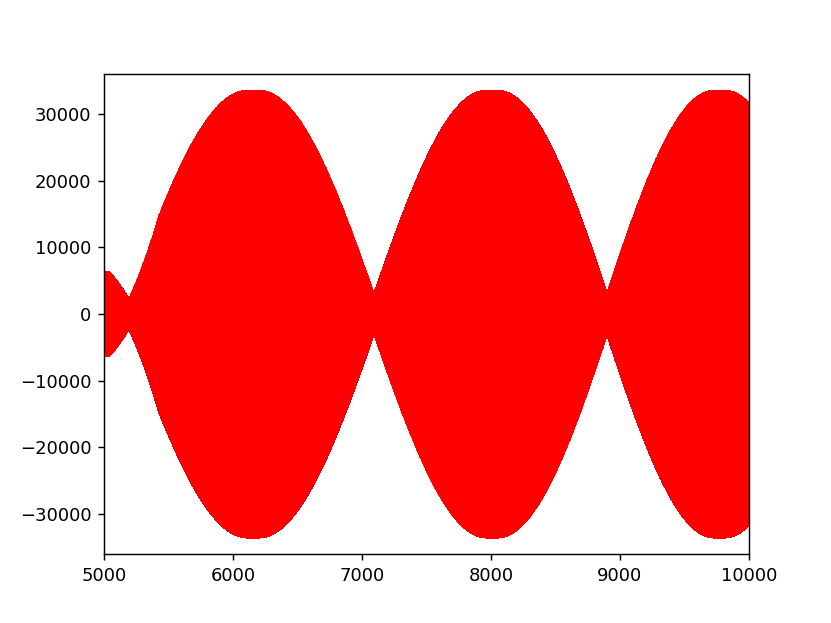

In [61]:
%matplotlib nbagg
plt.plot([unsigned_to_signed(x) for x in orig], "b-s")
plt.plot([unsigned_to_signed(x) for x in recon], "r-s")
plt.xlim((5000,10000))
plt.show()
